# Global Weather Forecast Data Exploration

## Environment Setup

In [7]:
# Import libraries
import json
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
# import xesmf as xe

import xarray as xr
import cartopy.crs as ccrs

# To make visualization better
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
# Config
with open('./config.json', 'r') as f:
    config = json.load(f)

In [3]:
dsrt = xr.open_dataset(config['path_pressure_level_rt'], engine='cfgrib') # relative humidity + temperature
dsuv = xr.open_dataset(config['path_pressure_level_uv'], engine='cfgrib') # u-wind + v-wind
dszq = xr.open_dataset(config['path_pressure_level_zq'], engine='cfgrib') # geopotential + specific humidity
dssl = xr.open_dataset(config['path_single_level_data'], engine='cfgrib') # single level variables

# Analysis on Relative Humidity + Temperature dataset

In [22]:
dsrt

<xarray.Dataset>
Dimensions:        (time: 4384, isobaricInhPa: 7, latitude: 721, longitude: 1440)
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
Data variables:
    q              (time, isobaricInhPa, latitude, longitude) float32 ...
    t              (time, isobaricInhPa, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2023-07-24T13:35 GRIB to CDM+CF via cfgrib-0.9.1...

In [18]:
# print("Data:")
# print(dsrt.data) --> too long to plot

print("Dimensions and Sizes:")
print(dsrt.dims)

print('---------------------------')

print("Coordinates:")
print(dsrt.coords)

print('---------------------------')

print("Attributes:")
print(dsrt.attrs)

print('---------------------------')

print(dsrt.data_vars)

Dimensions and Sizes:
Frozen({'time': 4384, 'isobaricInhPa': 7, 'latitude': 721, 'longitude': 1440})
---------------------------
Coordinates:
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
---------------------------
Attributes:
{'GRIB_edition': 1, 'GRIB_centre': 'ecmf', 'GRIB_centreDescription': 'European Centre for Medium-Range Weather Forecasts', 'GRIB_subCentre': 0, 'Conventions': 'CF-1.7', 'institution': 'European Centre for Medium-Range Weather Forecasts', 'history': '2023-07-26T21:58 GRIB to CDM+CF via cfgrib-0.9.10.4/ecCodes-2.24.2 with {"source": "../../../../srv/data/era5/era_rt.grib", "filter_by

In [14]:
print("Indexes:")
print(dsrt.indexes)

Indexes:
Indexes:
    time           DatetimeIndex(['1979-01-01 00:00:00', '1979-01-01 06:00:00',
               '1979-01-01 12:00:00', '1979-01-01 18:00:00',
               '1979-01-02 00:00:00', '1979-01-02 06:00:00',
               '1979-01-02 12:00:00', '1979-01-02 18:00:00',
               '1979-01-03 00:00:00', '1979-01-03 06:00:00',
               ...
               '1981-12-29 12:00:00', '1981-12-29 18:00:00',
               '1981-12-30 00:00:00', '1981-12-30 06:00:00',
               '1981-12-30 12:00:00', '1981-12-30 18:00:00',
               '1981-12-31 00:00:00', '1981-12-31 06:00:00',
               '1981-12-31 12:00:00', '1981-12-31 18:00:00'],
              dtype='datetime64[ns]', name='time', length=4384, freq=None)
    isobaricInhPa  Float64Index([925.0, 850.0, 700.0, 600.0, 500.0, 250.0, 50.0], dtype='float64', name='isobaricInhPa')
    latitude       Float64Index([  90.0,  89.75,   89.5,  89.25,   89.0,  88.75,   88.5,  88.25,
                88.0,  87.75,
          

In [24]:
type(dsrt)

xarray.core.dataset.Dataset

In [31]:
print(dir(dsrt))


['Conventions', 'GRIB_centre', 'GRIB_centreDescription', 'GRIB_edition', 'GRIB_subCentre', '_HANDLED_TYPES', '__abs__', '__abstractmethods__', '__add__', '__and__', '__annotations__', '__array__', '__array_priority__', '__array_ufunc__', '__bool__', '__class__', '__class_getitem__', '__contains__', '__copy__', '__dask_graph__', '__dask_keys__', '__dask_layers__', '__dask_optimize__', '__dask_postcompute__', '__dask_postpersist__', '__dask_scheduler__', '__dask_tokenize__', '__deepcopy__', '__delattr__', '__delitem__', '__dir__', '__doc__', '__enter__', '__eq__', '__exit__', '__floordiv__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__iadd__', '__iand__', '__ifloordiv__', '__ilshift__', '__imod__', '__imul__', '__init__', '__init_subclass__', '__invert__', '__ior__', '__ipow__', '__irshift__', '__isub__', '__iter__', '__itruediv__', '__ixor__', '__le__', '__len__', '__lshift__', '__lt__', '__mod__', '__module__', '__mul__', '__ne__',

Attributes of dsrt are saved in **notes.txt**

In [32]:
dsrt.all

<bound method DatasetAggregations.all of <xarray.Dataset>
Dimensions:        (time: 4384, isobaricInhPa: 7, latitude: 721, longitude: 1440)
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
Data variables:
    q              (time, isobaricInhPa, latitude, longitude) float32 ...
    t              (time, isobaricInhPa, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European 

In [36]:
dsrt.dims['isobaricInhPa']

7

In [37]:
type(dsrt.dims)

xarray.core.utils.Frozen

In xarray, xarray.core.utils.Frozen is a utility class used to create **immutable objects**. It is essentially a wrapper that prevents further modification of an object after it has been created. Immutable objects are objects whose state (data) cannot be changed after they are created.

The xarray.core.utils.Frozen class is used internally in xarray to create frozen versions of certain data structures, such as dictionaries, lists, and other objects. By creating frozen versions of these objects, xarray ensures that their content cannot be modified accidentally, helping to maintain data integrity and avoid unintended side effects.

In [51]:
dsrt.coords['latitude']


<xarray.DataArray 'latitude' (latitude: 721)>
array([ 90.  ,  89.75,  89.5 , ..., -89.5 , -89.75, -90.  ])
Coordinates:
    number    int64 ...
    step      timedelta64[ns] ...
  * latitude  (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
Attributes:
    units:             degrees_north
    standard_name:     latitude
    long_name:         latitude
    stored_direction:  decreasing

In [56]:
type(dsrt.coords['latitude'])

xarray.core.dataarray.DataArray

In xarray, **DataArray** is a fundamental data structure that represents a single multi-dimensional array with labeled dimensions and coordinates. It is similar to a NumPy array but provides additional functionality and advantages, such as labeled axes and broadcasting based on dimension names.

The DataArray class is at the core of xarray's data model and is used to store and manipulate multi-dimensional data with associated metadata. It is typically used to represent a single variable within a Dataset.

In [53]:
dsrt.coords['longitude']


<xarray.DataArray 'longitude' (longitude: 1440)>
array([0.0000e+00, 2.5000e-01, 5.0000e-01, ..., 3.5925e+02, 3.5950e+02,
       3.5975e+02])
Coordinates:
    number     int64 ...
    step       timedelta64[ns] ...
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Attributes:
    units:          degrees_east
    standard_name:  longitude
    long_name:      longitude

In [54]:
dsrt.coords['isobaricInhPa']

<xarray.DataArray 'isobaricInhPa' (isobaricInhPa: 7)>
array([925., 850., 700., 600., 500., 250.,  50.])
Coordinates:
    number         int64 ...
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
Attributes:
    long_name:         pressure
    units:             hPa
    positive:          down
    stored_direction:  decreasing
    standard_name:     air_pressure

In [55]:
dsrt.coords['time']

<xarray.DataArray 'time' (time: 4384)>
array(['1979-01-01T00:00:00.000000000', '1979-01-01T06:00:00.000000000',
       '1979-01-01T12:00:00.000000000', ..., '1981-12-31T06:00:00.000000000',
       '1981-12-31T12:00:00.000000000', '1981-12-31T18:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
    number      int64 ...
  * time        (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step        timedelta64[ns] ...
    valid_time  (time) datetime64[ns] ...
Attributes:
    long_name:      initial time of forecast
    standard_name:  forecast_reference_time

4384 time stamps

- 4 (data collection per day: 00:00, 06:00, 12:00, 18:00)
- 365 days (year 1979, 1981)
- 366 days (year 1980 leap year)

4 x (365 + 366 + 365) = 4384


In [39]:
type(dsrt.data_vars)

xarray.core.dataset.DataVariables

In xarray, **DataVariables** is an attribute of the Dataset class that provides a dictionary-like view of the variables contained in the dataset. It allows you to access and manipulate the individual variables of a dataset using dictionary-style indexing and methods.

When you create an xarray Dataset object, it contains multiple data variables, each representing a different set of multidimensional data (e.g., temperature, humidity, precipitation, etc.). The DataVariables attribute provides an easy way to work with these variables.

---------

In [47]:
type(dsrt['t'])

xarray.core.dataarray.DataArray

In [17]:
# print(temp.data) too long
dsrt.t[0]

<xarray.DataArray 't' (isobaricInhPa: 7, latitude: 721, longitude: 1440)>
[7267680 values with dtype=float32]
Coordinates:
    number         int64 ...
    time           datetime64[ns] 1979-01-01
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             130
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         isobaricInhPa
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                Temperature
    units:                                    K
    standard_name:                            air_temperature

In [23]:
print(dsrt.t.coords)

Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...


In [18]:
# temp[0] select data at 01-01-1979 at 00:00
dsrt.t[0].coords['time']

<xarray.DataArray 'time' ()>
array('1979-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    number      int64 ...
    time        datetime64[ns] 1979-01-01
    step        timedelta64[ns] ...
    valid_time  datetime64[ns] ...
Attributes:
    long_name:      initial time of forecast
    standard_name:  forecast_reference_time

In [21]:
# dsrt.t[5] select data at 01-02-1979 at 00:00
dsrt.t[5].coords['time']

<xarray.DataArray 'time' ()>
array('1979-01-02T06:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    number      int64 ...
    time        datetime64[ns] 1979-01-02T06:00:00
    step        timedelta64[ns] ...
    valid_time  datetime64[ns] ...
Attributes:
    long_name:      initial time of forecast
    standard_name:  forecast_reference_time

In [57]:
dsrt.t[0].values

array([[[242.16782, 242.16782, 242.16782, ..., 242.16782, 242.16782,
         242.16782],
        [241.98618, 241.98422, 241.98227, ..., 241.99008, 241.98813,
         241.98618],
        [241.56235, 241.55844, 241.55649, ..., 241.57211, 241.5682 ,
         241.5643 ],
        ...,
        [264.6971 , 264.69907, 264.69907, ..., 264.6971 , 264.6971 ,
         264.6971 ],
        [264.61508, 264.61703, 264.61703, ..., 264.61313, 264.61508,
         264.61508],
        [264.48618, 264.48618, 264.48618, ..., 264.48618, 264.48618,
         264.48618]],

       [[240.00725, 240.00725, 240.00725, ..., 240.00725, 240.00725,
         240.00725],
        [239.78459, 239.78459, 239.78459, ..., 239.78459, 239.78459,
         239.78459],
        [239.74553, 239.74553, 239.74553, ..., 239.74358, 239.74358,
         239.74553],
        ...,
        [260.45258, 260.45258, 260.45258, ..., 260.45062, 260.45062,
         260.45258],
        [260.3686 , 260.3686 , 260.37054, ..., 260.36664, 260.3686 ,
   

In [58]:
type(dsrt.t[0].values)

numpy.ndarray

In [59]:
dsrt.t[0].values.shape

(7, 721, 1440)

In [61]:
dsrt.t[0].values[0].shape

(721, 1440)

In [ ]:
# dsrt.t.values.shape too big

In [ ]:
dsrt.t

**Note**: date is month-day-year

In [24]:
dsrt.t.dims

('time', 'isobaricInhPa', 'latitude', 'longitude')

In [28]:
dsrt.t.dims[1]

'isobaricInhPa'

In [30]:
type(dsrt.t.coords)

xarray.core.coordinates.DataArrayCoordinates

In xarray, **DataArrayCoordinates** is not a standalone class. Instead, DataArrayCoordinates refers to the coordinates attribute of a DataArray object.

A DataArray in xarray represents a single multi-dimensional array with labeled dimensions and coordinates. Each DataArray contains metadata in the form of dimension names, coordinate values, and other attributes. The coordinates attribute of a DataArray holds information about its coordinates.

In [43]:
dsrt.t.coords['number']

<xarray.DataArray 'number' ()>
[1 values with dtype=int64]
Coordinates:
    number   int64 ...
    step     timedelta64[ns] ...
Attributes:
    long_name:      ensemble member numerical id
    units:          1
    standard_name:  realization

----

# Temperature 

In [13]:
temperature_var = dsrt.t
# temperature_var = dsrt['t']

# print("Data:")
# print(temperature_var.data)
# too long to plot

print("Dimensions and Sizes:")
print(temperature_var.dims)

print('---------------------------')

print("Coordinates:")
print(temperature_var.coords)

print('---------------------------')

print("Attributes:")
print(temperature_var.attrs)

print('---------------------------')

print("Variable Name:")
print(temperature_var.name)

print('---------------------------')

print("Shape:")
print(temperature_var.shape)

print('---------------------------')

print("Data Type:")
print(temperature_var.dtype)

Dimensions and Sizes:
('time', 'isobaricInhPa', 'latitude', 'longitude')
---------------------------
Coordinates:
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
---------------------------
Attributes:
{'GRIB_paramId': 130, 'GRIB_dataType': 'an', 'GRIB_numberOfPoints': 1038240, 'GRIB_typeOfLevel': 'isobaricInhPa', 'GRIB_stepUnits': 1, 'GRIB_stepType': 'instant', 'GRIB_gridType': 'regular_ll', 'GRIB_NV': 0, 'GRIB_Nx': 1440, 'GRIB_Ny': 721, 'GRIB_cfName': 'air_temperature', 'GRIB_cfVarName': 't', 'GRIB_gridDefinitionDescription': 'Latitude/Longitude Grid', 'GRIB_iDirectionIncrementInDegrees': 0.25, 'GRIB_iSca

In [21]:
print("values:")
print(temperature_var.coords['latitude'].values)

print('---------------------------')

print("Shape:")
print(temperature_var.coords['latitude'].shape)

print('---------------------------')

print("dtype:")
print(temperature_var.coords['latitude'].dtype)

lat = temperature_var.coords['latitude'].values

# 0.25 degree

values:
[ 90.    89.75  89.5   89.25  89.    88.75  88.5   88.25  88.    87.75
  87.5   87.25  87.    86.75  86.5   86.25  86.    85.75  85.5   85.25
  85.    84.75  84.5   84.25  84.    83.75  83.5   83.25  83.    82.75
  82.5   82.25  82.    81.75  81.5   81.25  81.    80.75  80.5   80.25
  80.    79.75  79.5   79.25  79.    78.75  78.5   78.25  78.    77.75
  77.5   77.25  77.    76.75  76.5   76.25  76.    75.75  75.5   75.25
  75.    74.75  74.5   74.25  74.    73.75  73.5   73.25  73.    72.75
  72.5   72.25  72.    71.75  71.5   71.25  71.    70.75  70.5   70.25
  70.    69.75  69.5   69.25  69.    68.75  68.5   68.25  68.    67.75
  67.5   67.25  67.    66.75  66.5   66.25  66.    65.75  65.5   65.25
  65.    64.75  64.5   64.25  64.    63.75  63.5   63.25  63.    62.75
  62.5   62.25  62.    61.75  61.5   61.25  61.    60.75  60.5   60.25
  60.    59.75  59.5   59.25  59.    58.75  58.5   58.25  58.    57.75
  57.5   57.25  57.    56.75  56.5   56.25  56.    55.75  55.5   55.2

In [22]:
print("values:")
print(temperature_var.coords['longitude'].values)

print('---------------------------')

print("Shape:")
print(temperature_var.coords['longitude'].shape)

print('---------------------------')

print("dtype:")
print(temperature_var.coords['longitude'].dtype)

lon = temperature_var.coords['longitude'].values

# 0.25 degree

values:
[0.0000e+00 2.5000e-01 5.0000e-01 ... 3.5925e+02 3.5950e+02 3.5975e+02]
---------------------------
Shape:
(1440,)
---------------------------
dtype:
float64


In [23]:
# Pressure levels
temperature_var.coords['isobaricInhPa'].values

array([925., 850., 700., 600., 500., 250.,  50.])

In [9]:
print(temperature_var.attrs.keys())

dict_keys(['GRIB_paramId', 'GRIB_dataType', 'GRIB_numberOfPoints', 'GRIB_typeOfLevel', 'GRIB_stepUnits', 'GRIB_stepType', 'GRIB_gridType', 'GRIB_NV', 'GRIB_Nx', 'GRIB_Ny', 'GRIB_cfName', 'GRIB_cfVarName', 'GRIB_gridDefinitionDescription', 'GRIB_iDirectionIncrementInDegrees', 'GRIB_iScansNegatively', 'GRIB_jDirectionIncrementInDegrees', 'GRIB_jPointsAreConsecutive', 'GRIB_jScansPositively', 'GRIB_latitudeOfFirstGridPointInDegrees', 'GRIB_latitudeOfLastGridPointInDegrees', 'GRIB_longitudeOfFirstGridPointInDegrees', 'GRIB_longitudeOfLastGridPointInDegrees', 'GRIB_missingValue', 'GRIB_name', 'GRIB_shortName', 'GRIB_totalNumber', 'GRIB_units', 'long_name', 'units', 'standard_name'])


In [24]:
# Attributes temperature
temperature_var.attrs

{'GRIB_paramId': 130,
 'GRIB_dataType': 'an',
 'GRIB_numberOfPoints': 1038240,
 'GRIB_typeOfLevel': 'isobaricInhPa',
 'GRIB_stepUnits': 1,
 'GRIB_stepType': 'instant',
 'GRIB_gridType': 'regular_ll',
 'GRIB_NV': 0,
 'GRIB_Nx': 1440,
 'GRIB_Ny': 721,
 'GRIB_cfName': 'air_temperature',
 'GRIB_cfVarName': 't',
 'GRIB_gridDefinitionDescription': 'Latitude/Longitude Grid',
 'GRIB_iDirectionIncrementInDegrees': 0.25,
 'GRIB_iScansNegatively': 0,
 'GRIB_jDirectionIncrementInDegrees': 0.25,
 'GRIB_jPointsAreConsecutive': 0,
 'GRIB_jScansPositively': 0,
 'GRIB_latitudeOfFirstGridPointInDegrees': 90.0,
 'GRIB_latitudeOfLastGridPointInDegrees': -90.0,
 'GRIB_longitudeOfFirstGridPointInDegrees': 0.0,
 'GRIB_longitudeOfLastGridPointInDegrees': 359.75,
 'GRIB_missingValue': 3.4028234663852886e+38,
 'GRIB_name': 'Temperature',
 'GRIB_shortName': 't',
 'GRIB_totalNumber': 0,
 'GRIB_units': 'K',
 'long_name': 'Temperature',
 'units': 'K',
 'standard_name': 'air_temperature'}

In [25]:
type(temperature_var)

xarray.core.dataarray.DataArray

In [26]:
temperature_var.values.shape

(4384, 7, 721, 1440)

In [15]:
# temperature: 01-01-1979, 00:00, 925hPa
# Select as an numpy array
t_010179_0000_925hPa = temperature_var[0, 0, :, :].values
t_010179_0000_925hPa

array([[242.16782, 242.16782, 242.16782, ..., 242.16782, 242.16782,
        242.16782],
       [241.98618, 241.98422, 241.98227, ..., 241.99008, 241.98813,
        241.98618],
       [241.56235, 241.55844, 241.55649, ..., 241.57211, 241.5682 ,
        241.5643 ],
       ...,
       [264.6971 , 264.69907, 264.69907, ..., 264.6971 , 264.6971 ,
        264.6971 ],
       [264.61508, 264.61703, 264.61703, ..., 264.61313, 264.61508,
        264.61508],
       [264.48618, 264.48618, 264.48618, ..., 264.48618, 264.48618,
        264.48618]], dtype=float32)

In [16]:
t_010179_0000_925hPa = temperature_var[0, 0, :, :]
t_010179_0000_925hPa

<xarray.DataArray 't' (latitude: 721, longitude: 1440)>
[1038240 values with dtype=float32]
Coordinates:
    number         int64 ...
    time           datetime64[ns] 1979-01-01
    step           timedelta64[ns] ...
    isobaricInhPa  float64 925.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             130
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         isobaricInhPa
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                Temperature
    units:                                    K
    standard_name:                            air_temperature

In [35]:
t_010179_0000_925hPa.shape

(721, 1440)

In [17]:
t_all_925hPa = temperature_var[:, 0, :, :].values

In [56]:
t_all_925hPa.shape

(4384, 721, 1440)

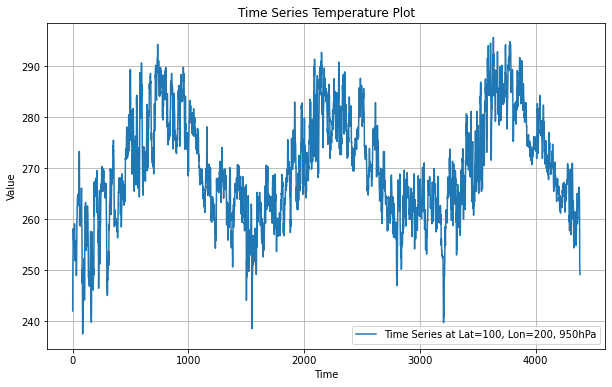

In [59]:
lat_index = 100
lon_index = 200
location_data = t_all_925hPa[:, lat_index, lon_index]

# Create a time array (replace this with your actual time array if available)
# For this example, let's assume time spans from 1 to 4384
time_array = np.arange(1, 4385)

# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(time_array, location_data, label='Time Series at Lat=100, Lon=200, 950hPa')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Time Series Temperature Plot')
plt.legend()
plt.grid(True)

plt.show()

In [19]:
t_010179_0000_allhPa = temperature_var[0, :, :, :].values
t_010179_0000_allhPa.shape

(7, 721, 1440)

In [22]:
lat_index = 100
lon_index = 200
location_data = t_010179_0000_allhPa[:, lat_index, lon_index]
location_data.shape

(7,)

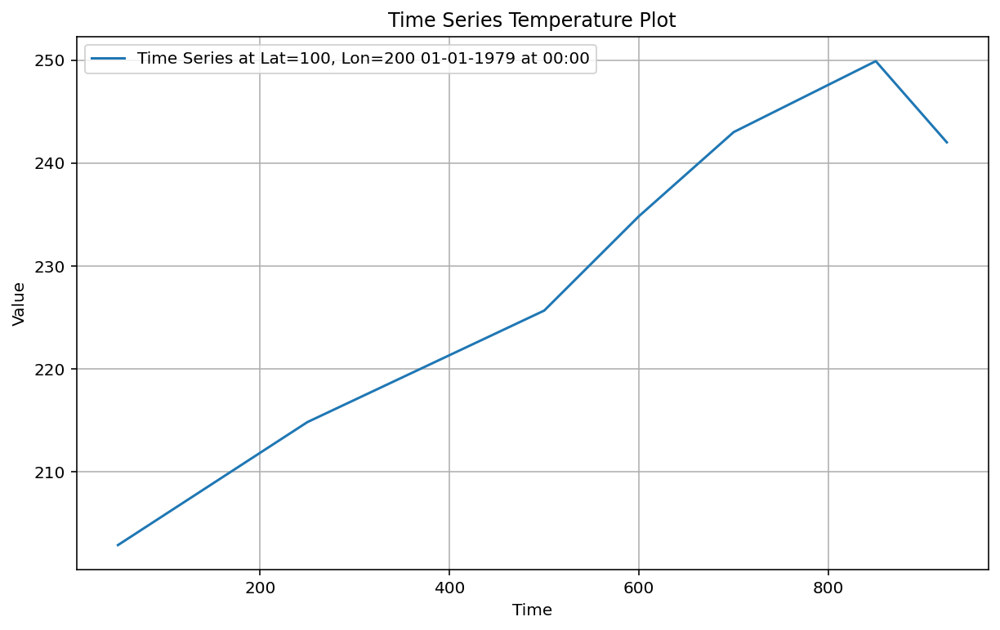

In [23]:
lat_index = 100
lon_index = 200
location_data = t_010179_0000_allhPa[:, lat_index, lon_index]

# Create a time array (replace this with your actual time array if available)
# For this example, let's assume time spans from 1 to 4384
time_array = list(temperature_var.coords['isobaricInhPa'].values)

# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(time_array, location_data, label='Time Series at Lat=100, Lon=200 01-01-1979 at 00:00')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Time Series Temperature Plot')
plt.legend()
plt.grid(True)

plt.show()

In [61]:
t_010179_0000_925hPa.shape

(721, 1440)

In [8]:
# Add latitude as first column and longitude as first row
print(lat.shape, lon.shape)
print(type(lat), type(lon))

(721,) (1440,)
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [9]:
t_010179_0000_925hPa.shape

(721, 1440)

In [10]:
t_010179_0000_925hPa_pd = pd.DataFrame(t_010179_0000_925hPa, index=list(lat), columns=list(lon))

In [11]:
t_010179_0000_925hPa_pd

,0.00,0.25,0.50,0.75,1.00,1.25,1.50,1.75,2.00,2.25,...,357.50,357.75,358.00,358.25,358.50,358.75,359.00,359.25,359.50,359.75
90.00,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,...,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816,242.167816
89.75,241.986176,241.984222,241.982269,241.982269,241.980316,241.978363,241.978363,241.976410,241.974457,241.974457,...,241.999847,241.997894,241.997894,241.995941,241.993988,241.992035,241.992035,241.990082,241.988129,241.986176
89.50,241.562347,241.558441,241.556488,241.552582,241.550629,241.546722,241.544769,241.540863,241.538910,241.536957,...,241.595551,241.591644,241.587738,241.583832,241.581879,241.577972,241.574066,241.572113,241.568207,241.564301
89.25,240.829926,240.826019,240.822113,240.816254,240.812347,240.808441,240.804535,240.800629,240.796722,240.792816,...,240.878754,240.872894,240.867035,240.863129,240.857269,240.853363,240.847504,240.843597,240.839691,240.833832
89.00,239.941254,239.933441,239.927582,239.919769,239.911957,239.906097,239.898285,239.892426,239.886566,239.878754,...,240.017426,240.009613,240.001801,239.993988,239.986176,239.978363,239.970551,239.962738,239.954926,239.949066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-89.00,264.837738,264.837738,264.837738,264.837738,264.837738,264.837738,264.837738,264.837738,264.837738,264.837738,...,264.833832,264.833832,264.835785,264.835785,264.835785,264.835785,264.837738,264.837738,264.837738,264.837738
-89.25,264.763519,264.763519,264.763519,264.765472,264.765472,264.765472,264.765472,264.765472,264.765472,264.765472,...,264.759613,264.759613,264.761566,264.761566,264.761566,264.761566,264.763519,264.763519,264.763519,264.763519
-89.50,264.697113,264.699066,264.699066,264.699066,264.699066,264.701019,264.701019,264.701019,264.701019,264.701019,...,264.691254,264.693207,264.693207,264.693207,264.695160,264.695160,264.695160,264.697113,264.697113,264.697113
-89.75,264.615082,264.617035,264.617035,264.617035,264.617035,264.618988,264.618988,264.618988,264.620941,264.620941,...,264.609222,264.611176,264.611176,264.611176,264.613129,264.613129,264.613129,264.613129,264.615082,264.615082


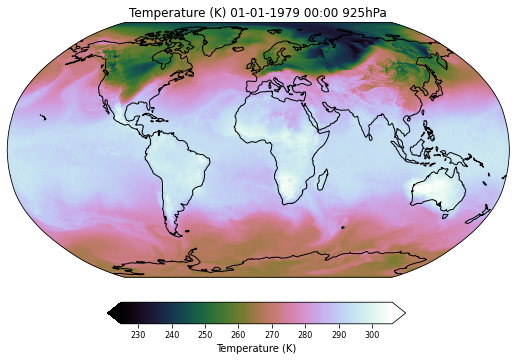

In [14]:
# Set a global map with chosen projection and plot the raster data

# Note on pcolormesh
# pcolormesh fills the grid cells / pixels identified by either grid edges or grid centroids
# Be careful of the way your raster data is organized

# https://matplotlib.org/3.5.1/api/_as_gen/matplotlib.pyplot.pcolormesh.html


fig = plt.figure(figsize=(9,6))  # x,y(inches)

ax = plt.axes(projection=ccrs.Robinson())
ax.set_global()
ax.set_title('Temperature (K) 01-01-1979 00:00 925hPa')

mm = ax.pcolormesh(t_010179_0000_925hPa_pd.columns, # longitude
                   t_010179_0000_925hPa_pd.index, # latitude
                   t_010179_0000_925hPa_pd, # data
                   shading='auto', \
                   transform=ccrs.PlateCarree(),
                   cmap=mpl.cm.cubehelix )

# more color palettes here:
#   https://matplotlib.org/3.1.3/tutorials/colors/colormaps.html

ax.coastlines()

#- add colorbar
cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
cbar.set_label('Temperature (K)') #($\mu g$ $m^{-3}$)
cbar.ax.tick_params(labelsize=8)

plt.savefig('./graphs/t_010179_0000_925hPa.jpg')
plt.show()
plt.close()

In [27]:
t_010179_0000_925hPa

<xarray.DataArray 't' (latitude: 721, longitude: 1440)>
[1038240 values with dtype=float32]
Coordinates:
    number         int64 ...
    time           datetime64[ns] 1979-01-01
    step           timedelta64[ns] ...
    isobaricInhPa  float64 925.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             130
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         isobaricInhPa
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                Temperature
    units:                                    K
    standard_name:                            air_temperature

In [38]:
var_longname = t_010179_0000_925hPa.attrs['long_name']
var_shortname = t_010179_0000_925hPa.attrs['GRIB_shortName']
units = t_010179_0000_925hPa.attrs['units']
print(var_longname, var_shortname, units)
print(type(var_longname), type(var_shortname), type(units))

Temperature t K
<class 'str'> <class 'str'> <class 'str'>


In [36]:
datetime64_obj = t_010179_0000_925hPa.coords['time'].values
pydatetime = datetime64_obj.astype('datetime64[s]').tolist()
time = pydatetime.strftime('%H:%M:%S')
date = str(pydatetime.date())
print(time, date)
print(type(time), type(date))

00:00:00 1979-01-01
<class 'str'> <class 'str'>


In [ ]:
lat = t_010179_0000_925hPa.coords['latitude'].values
lon = t_010179_0000_925hPa.coords['longitude'].values

In [15]:
def plot_globalvar(data: xr.DataArray,
                   hPa: int):

    # Set a global map with chosen projection and plot the raster data

    # Note on pcolormesh
    # pcolormesh fills the grid cells / pixels identified by either grid edges or grid centroids
    # Be careful of the way your raster data is organized

    # https://matplotlib.org/3.5.1/api/_as_gen/matplotlib.pyplot.pcolormesh.html

    var_longname = data.attrs['long_name']
    var_shortname = data.attrs['GRIB_shortName']
    units = data.attrs['units']
    
    datetime64_obj = data.coords['time'].values
    pydatetime = datetime64_obj.astype('datetime64[s]').tolist()
    time = pydatetime.strftime('%H:%M:%S')
    date = str(pydatetime.date())
    
    lat = list(data.coords['latitude'].values)
    lon = list(data.coords['longitude'].values)
    
    datadf = pd.DataFrame(data, index=lat, columns=lon)

    fig = plt.figure(figsize=(9,6))  # x,y(inches)

    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    title = var_longname + ' (' + units + ') ' + date + ' ' + time + ' ' + str(hPa)+ 'hPa'
    ax.set_title(title)
    

    mm = ax.pcolormesh(datadf.columns, # longitude
                    datadf.index, # latitude
                    datadf, # data
                    shading='auto', \
                    transform=ccrs.PlateCarree(),
                    cmap=mpl.cm.cubehelix )

    # more color palettes here:
    #   https://matplotlib.org/3.1.3/tutorials/colors/colormaps.html

    ax.coastlines()

    #- add colorbar
    cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
    cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
    label = var_longname + ' (' + units + ')'
    cbar.set_label(label) #($\mu g$ $m^{-3}$)
    cbar.ax.tick_params(labelsize=8)

    save_name = var_shortname+'_'+date+'_'+time+'_'+str(hPa)
    
    plt.savefig('./plots/' + save_name + '.jpg')
    plt.show()
    plt.close()
    
    return('done')

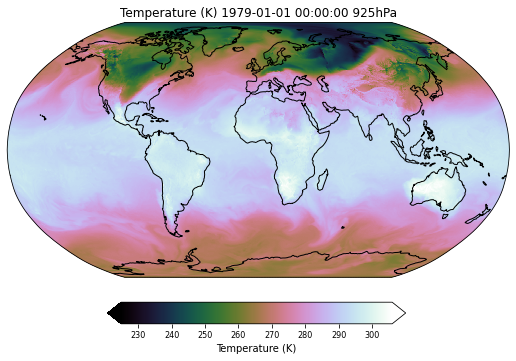

'done'

In [49]:
plot_globalvar(data = t_010179_0000_925hPa,
               hPa = 925)

In [65]:
def plot_global_var1day(data0000: xr.DataArray,
                        data0600: xr.DataArray,
                        data1200: xr.DataArray,
                        data1800: xr.DataArray,
                        hPa: int,
                        date: str):
    
    # dim A4 paper sheet
    fig, ax = plt.subplots(2,2, figsize=(36, 24))
    
    plt.sca(ax[0, 0])  # Set the current axis to axes[0, 0]
    plot_globalvar(data = data0000, hPa = hPa)
    
    plt.sca(ax[0, 1])  # Set the current axis to axes[0, 0]
    plot_globalvar(data = data0600, hPa = hPa)
    
    plt.sca(ax[1, 0])  # Set the current axis to axes[0, 0]
    plot_globalvar(data = data1200, hPa = hPa)
    
    plt.sca(ax[1, 1])  # Set the current axis to axes[0, 0]
    plot_globalvar(data = data1800, hPa = hPa)
    
    # Adjust spacing between subplots
    plt.tight_layout()
    
    plt.savefig('./plots/' + date + '_' + str(hPa) + 'hPa.jpg')
    plt.show()
    plt.close()
    
    return print('done')

In [56]:
listhPa = list(temperature_var.coords['isobaricInhPa'].values)
listhPa

[925.0, 850.0, 700.0, 600.0, 500.0, 250.0, 50.0]

In [60]:
t_010179_0000_925hPa = temperature_var[0, 0, :, :]
print(t_010179_0000_925hPa.coords['time'].values)
t_010179_0600_925hPa = temperature_var[1, 0, :, :]
print(t_010179_0600_925hPa.coords['time'].values)
t_010179_1200_925hPa = temperature_var[2, 0, :, :]
print(t_010179_1200_925hPa.coords['time'].values)
t_010179_1800_925hPa = temperature_var[3, 0, :, :]
print(t_010179_1800_925hPa.coords['time'].values)
# correct


1979-01-01T00:00:00.000000000
1979-01-01T06:00:00.000000000
1979-01-01T12:00:00.000000000
1979-01-01T18:00:00.000000000


In [ ]:
# Da sistemare
plot_global_var1day(data0000 = t_010179_0000_925hPa,
                    data0600 = t_010179_0600_925hPa,
                    data1200 = t_010179_1200_925hPa,
                    data1800 = t_010179_1800_925hPa,
                    hPa = 925,
                    date = '19790101')

In [59]:
t_010179_0600_925hPa.coords['time'].values

numpy.datetime64('1979-01-01T06:00:00.000000000')

In [ ]:
# run on time
for i in range(4):
    temperature_var[i, 0, :, :]
    

In [ ]:
# run on hPa level
for i in range(len(listhPa)):
    data = temperature_var[0, i, :, :]
    hPa = listhPa[i]
    

## Video plot

In [6]:
temperature_var.shape

(4384, 7, 721, 1440)

In [45]:
def plot_globalvar(data: xr.DataArray,
                   hPa: int,
                   save_name: str):

    # Set a global map with chosen projection and plot the raster data

    # Note on pcolormesh
    # pcolormesh fills the grid cells / pixels identified by either grid edges or grid centroids
    # Be careful of the way your raster data is organized

    # https://matplotlib.org/3.5.1/api/_as_gen/matplotlib.pyplot.pcolormesh.html

    var_longname = data.attrs['long_name']
    var_shortname = data.attrs['GRIB_shortName']
    units = data.attrs['units']
    
    datetime64_obj = data.coords['time'].values
    pydatetime = datetime64_obj.astype('datetime64[s]').tolist()
    time = pydatetime.strftime('%H:%M:%S')
    date = str(pydatetime.date())
    
    lat = list(data.coords['latitude'].values)
    lon = list(data.coords['longitude'].values)
    
    datadf = pd.DataFrame(data, index=lat, columns=lon)

    fig = plt.figure(figsize=(9,6))  # x,y(inches)

    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    title = var_longname + ' (' + units + ') ' + date + ' ' + time + ' ' + str(hPa)+ 'hPa'
    ax.set_title(title)
    

    mm = ax.pcolormesh(datadf.columns, # longitude
                       datadf.index, # latitude
                       datadf, # data
                       shading='auto', \
                       transform=ccrs.PlateCarree(),
                       cmap=mpl.cm.cubehelix )

    # more color palettes here:
    #   https://matplotlib.org/3.1.3/tutorials/colors/colormaps.html

    ax.coastlines()

    #- add colorbar
    
    cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
    cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
    label = var_longname + ' (' + units + ')'
    cbar.set_label(label) #($\mu g$ $m^{-3}$)
    cbar.ax.tick_params(labelsize=8)
    
    plt.savefig('./prova/' + save_name)
    plt.show()
    plt.close()
    
    return('done')

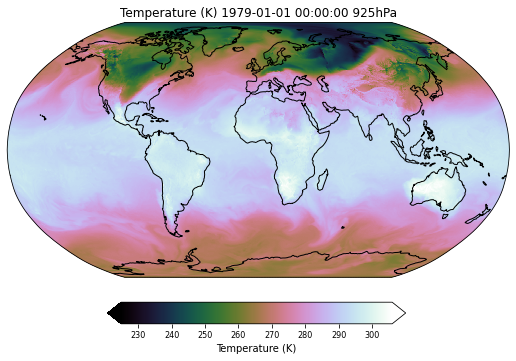

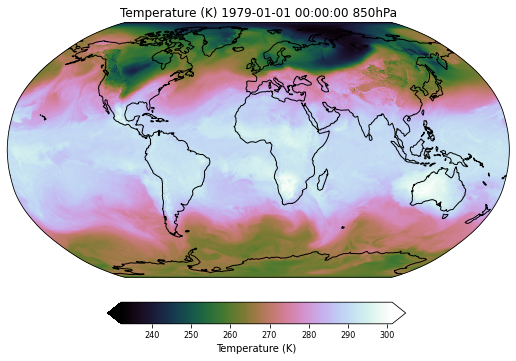

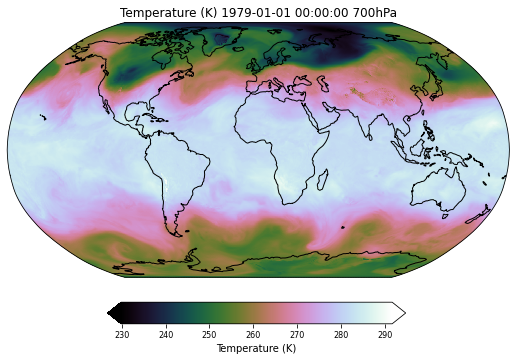

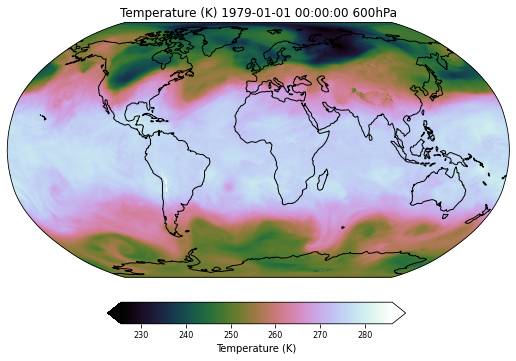

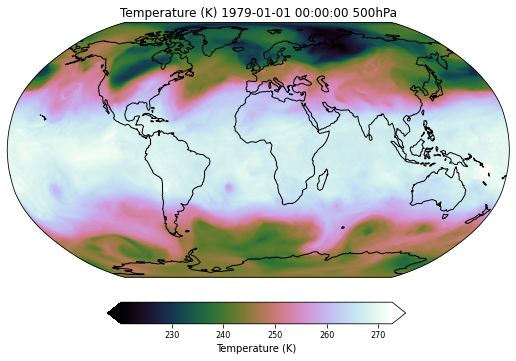

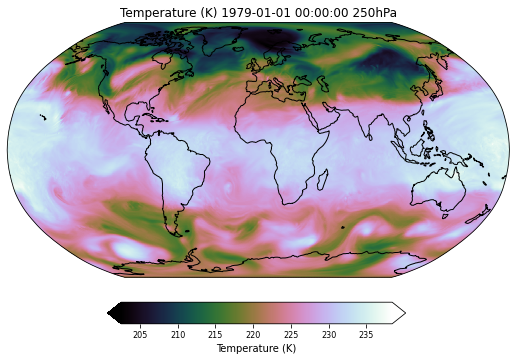

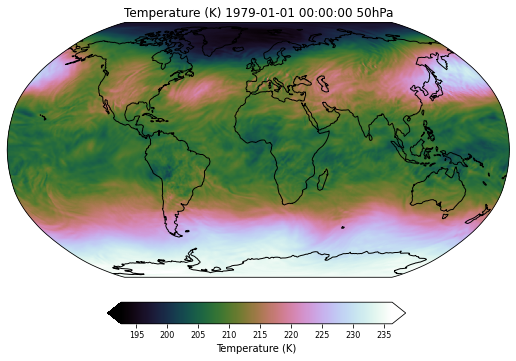

In [46]:
for i in range(temperature_var.shape[0]):
    x = temperature_var[0, i, :, :]
    hPa = int(x.coords['isobaricInhPa'].values)
    plot_globalvar(data= x, 
                   hPa=hPa, 
                   save_name=f'plot_{i+1}.png')
    # save_name = f'plot_{i+1}.png'
    

In [35]:
# Use OpenCV to create the video from the saved images
frame_rate = 1  # Number of frames per second
output_video = 'plots_video_010179_perhPa.mp4'

image_path_pattern = './prova/plot_{}.png'
first_image = cv2.imread(image_path_pattern.format(1))
height, width, _ = first_image.shape
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video = cv2.VideoWriter(output_video, fourcc, frame_rate, (width, height))

for i in range(1, temperature_var.shape[1]+1):
    image_path = image_path_pattern.format(i)
    frame = cv2.imread(image_path)
    video.write(frame)

    # Uncomment the line below if you want to display the frames while generating the video
    # cv2.imshow('Frame', frame)
    # cv2.waitKey(1000 // frame_rate)

# Release the video writer and close any open windows (if using cv2.imshow())
video.release()
cv2.destroyAllWindows()

# Temperature 2m

In [27]:
t2m = dssl.t2m

In [28]:
t2m

<xarray.DataArray 't2m' (time: 4384, latitude: 721, longitude: 1440)>
[4551644160 values with dtype=float32]
Coordinates:
    number      int64 ...
  * time        (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step        timedelta64[ns] ...
    surface     float64 ...
  * latitude    (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [29]:
# Select 32-12-1981 at 12:00
t2m.sel(time='1981-12-31T12:00:00.000000000')

<xarray.DataArray 't2m' (latitude: 721, longitude: 1440)>
[1038240 values with dtype=float32]
Coordinates:
    number      int64 ...
    time        datetime64[ns] 1981-12-31T12:00:00
    step        timedelta64[ns] ...
    surface     float64 ...
  * latitude    (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time  datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [31]:
t2m.shape

(4384, 721, 1440)

In [33]:
t2m.sel(time='1981-12-31T12:00:00.000000000').shape

(721, 1440)

Text(0.5, 1.0, 'ERA5 air temperature at 2 metres 31th December 1981 at 12:00 UTC')

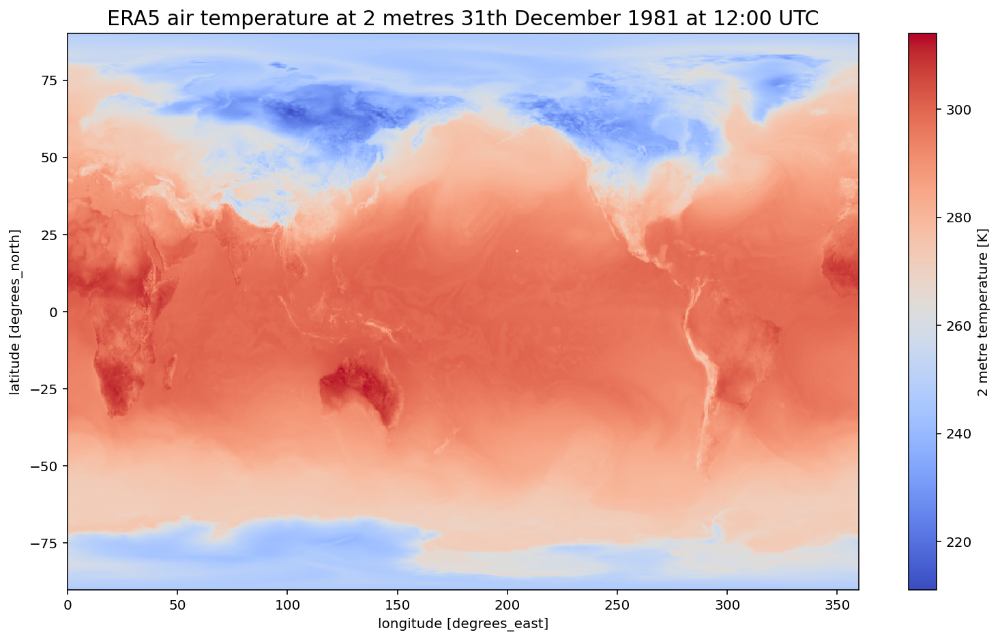

In [55]:
# Plot data
plt.figure(1, figsize=[13,7.5])
t2m.sel(time='1981-12-31T12:00:00.000000000').plot(cmap = 'coolwarm')
plt.title("ERA5 air temperature at 2 metres 31th December 1981 at 12:00 UTC", fontsize=15)

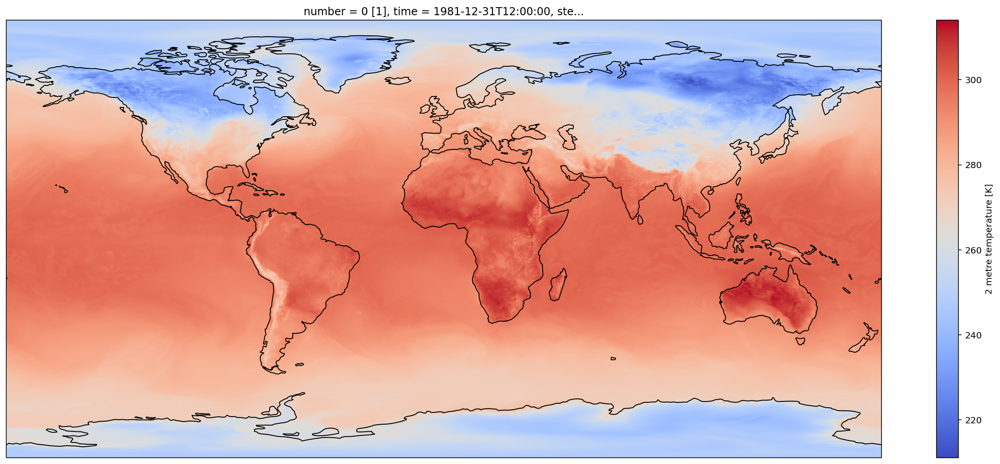

In [48]:
# Customize plot
fig = plt.figure(1, figsize=[22,9])

# Set the projection to use for plotting
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines()

# Pass ax as an argument when plotting. Here we assume data is in the same coordinate reference system than the projection chosen for plotting
# isel allows to select by indices instead of the time values
t2m.sel(time='1981-12-31T12:00:00.000000000').plot.pcolormesh(ax=ax, cmap='coolwarm')

Text(0.5, 1.0, 'ERA5 air temperature at 2 metres\n 31th December 1981 at 12:00 UTC')

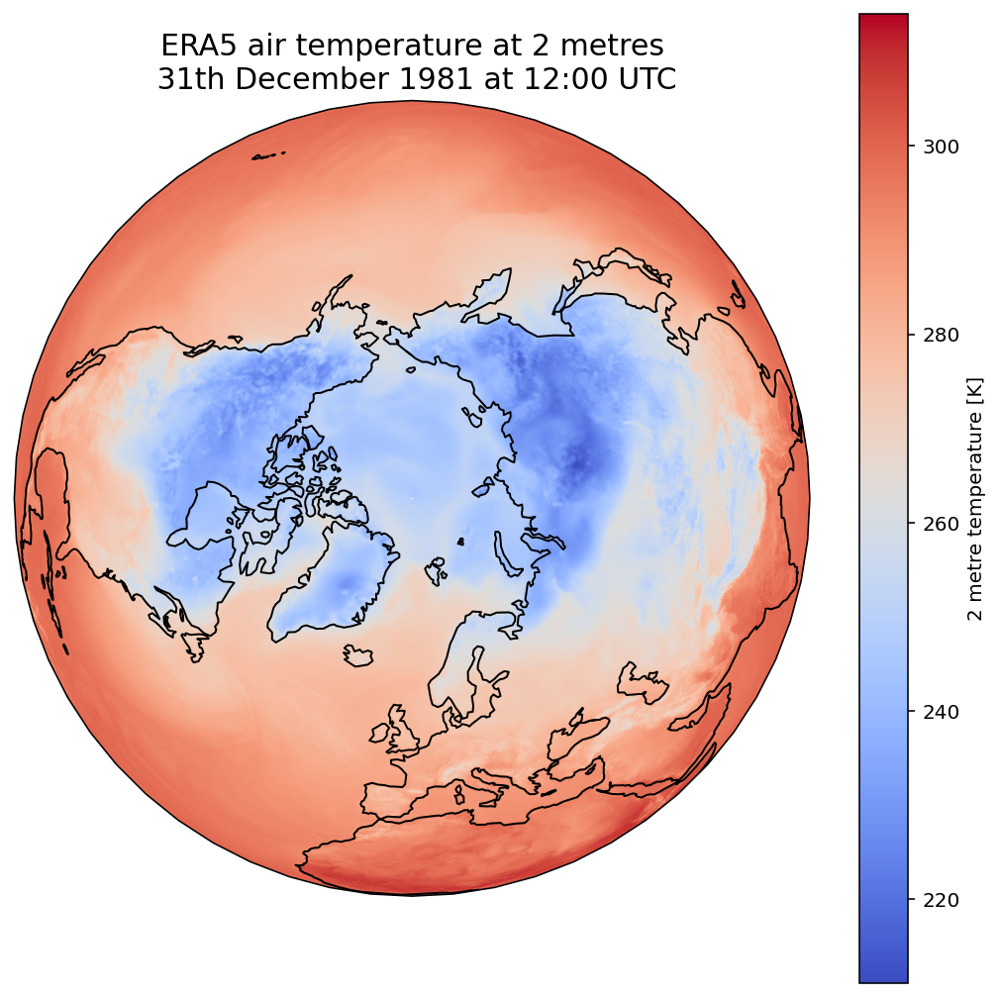

In [40]:
# Change plotting projection
fig = plt.figure(1, figsize=[9,9])

# Use cartopy and plot in Orthographic projection 
# (see documentation on cartopy)
ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
ax.coastlines()

# We need to project our data to the new Orthographic projection and for this we use `transform`.
# we set the original data projection in transform (here PlateCarree)
t2m.sel(time='1981-12-31T12:00:00.000000000').plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm')

# One way to customize your title
plt.title("ERA5 air temperature at 2 metres\n 31th December 1981 at 12:00 UTC", fontsize=15)

Text(0.5, 1.0, 'ERA5 air temperature at 2 metres\n 31th December 1981 at 12:00 UTC')

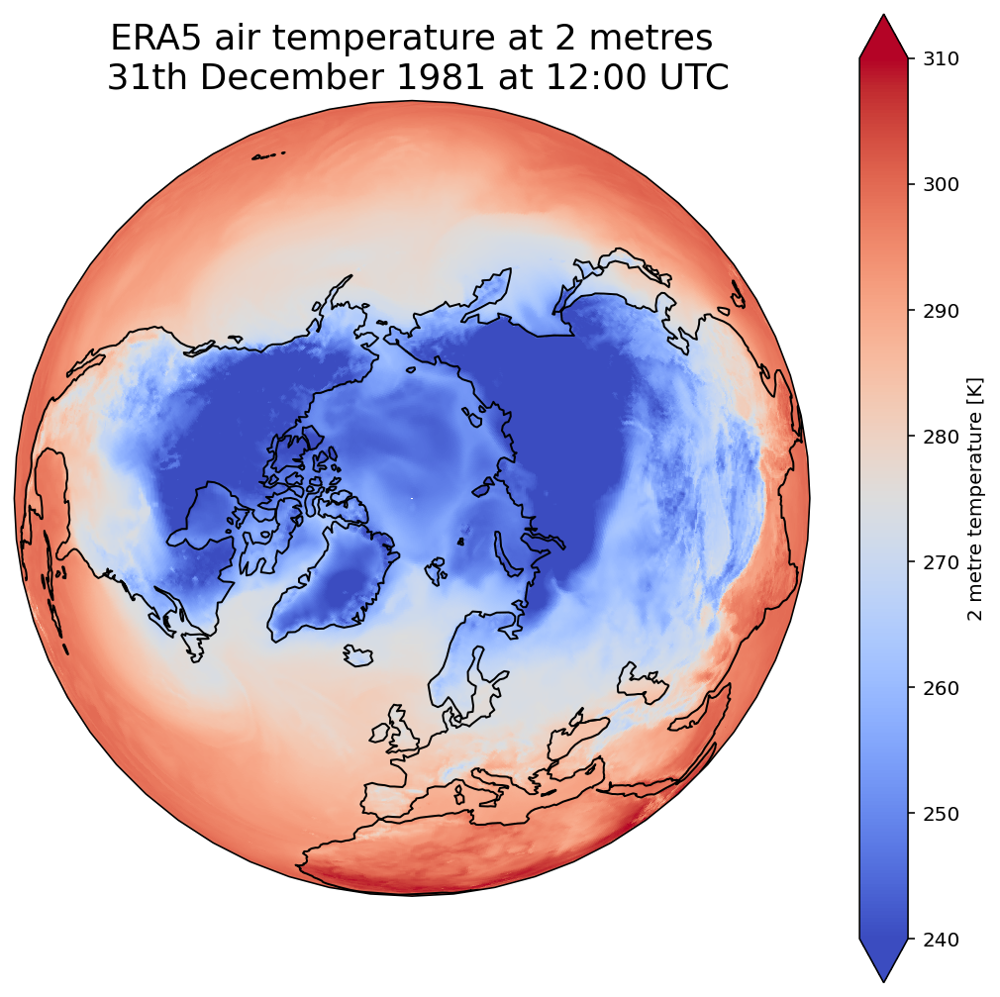

In [42]:
# Choose extent values
fig = plt.figure(1, figsize=[9,9])

ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
ax.coastlines()

# Fix extent
minval = 240
maxval = 310

# pass extent with vmin and vmax parameters
t2m.sel(time='1981-12-31T12:00:00.000000000').plot(ax=ax, vmin=minval, vmax=maxval, transform=ccrs.PlateCarree(), cmap='coolwarm')

# One way to customize your title
plt.title("ERA5 air temperature at 2 metres\n 31th December 1981 at 12:00 UTC", fontsize=18)

Text(0, 0.5, 'K')

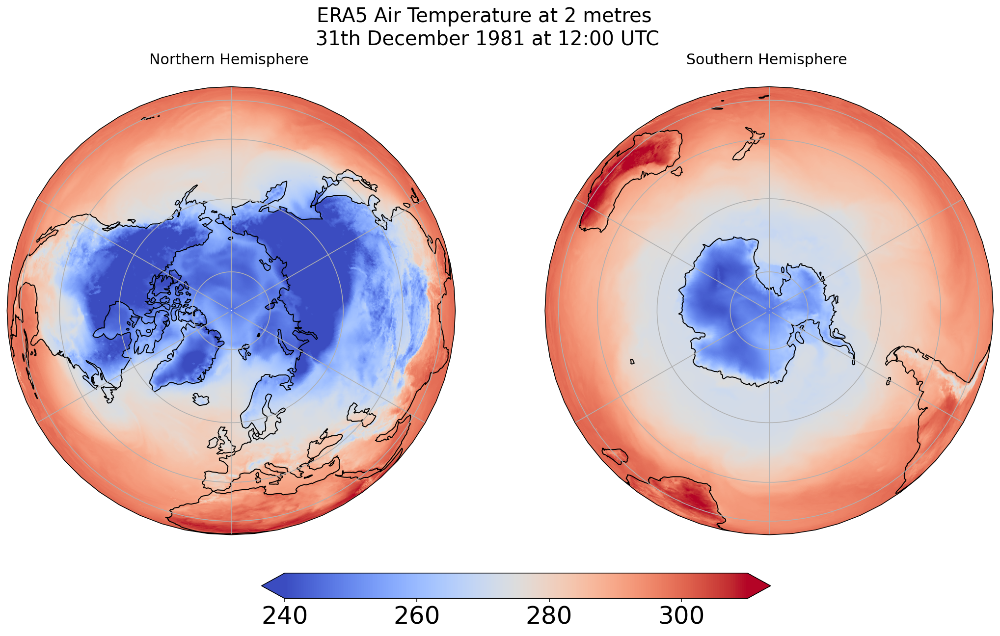

In [51]:
# Combine plot with different projections
fig = plt.figure(1, figsize=[18,9])

# Fix extent
minval = 240
maxval = 310

# Plot 1 for Northern Hemisphere subplot argument (nrows, ncols, nplot)
# here 1 row, 2 columns and 1st plot
ax1 = plt.subplot(1, 2, 1, projection=ccrs.Orthographic(0, 90))

# Plot 2 for Southern Hemisphere
# 2nd plot 
ax2 = plt.subplot(1, 2, 2, projection=ccrs.Orthographic(180, -90))

tsel = 0
for ax,t in zip([ax1, ax2], ["Northern", "Southern"]):
    map = t2m.sel(time='1981-12-31T12:00:00.000000000').plot(ax=ax, vmin=minval, vmax=maxval, 
                                                             transform=ccrs.PlateCarree(), 
                                                             cmap='coolwarm', 
                                                             add_colorbar=False)
    ax.set_title(t + " Hemisphere \n" , fontsize=15)
    ax.coastlines()
    ax.gridlines()

# Title for both plots
fig.suptitle('ERA5 Air Temperature at 2 metres\n 31th December 1981 at 12:00 UTC', fontsize=20)


cb_ax = fig.add_axes([0.325, 0.05, 0.4, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, extend='both', orientation='horizontal', fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel('K', fontsize=25)

In [67]:
# Select day 79 since the starting date of dataset
t2m.isel(time=76).coords['time'].values, str(t2m.isel(time=76).coords['time'].values)

(numpy.datetime64('1979-01-20T00:00:00.000000000'),
 '1979-01-20T00:00:00.000000000')

In [71]:
# Extract date as a string
date_str = np.datetime_as_string(t2m.isel(time=76).coords['time'].values, unit='D')
# Extract time as a string
time_str = np.datetime_as_string(t2m.isel(time=76).coords['time'].values, unit='s')[11:16]
print("Date: ", date_str)
print("Time: ", time_str)

Date:  1979-01-20
Time:  00:00


Text(0.5, 1.0, 'ERA5 air temperature at 2 metres 1979-01-20 at 00:00 UTC')

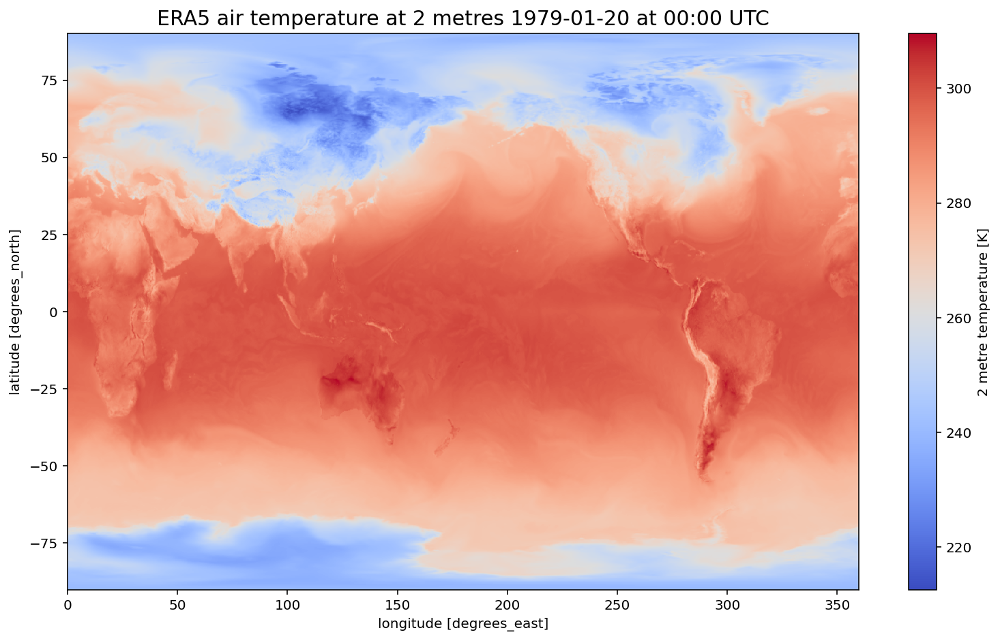

In [72]:
# Plot data
plt.figure(1, figsize=[13,7.5])
t2m.isel(time=76).plot(cmap = 'coolwarm',
                       x="longitude")
plt.title(f'ERA5 air temperature at 2 metres {date_str} at {time_str} UTC', fontsize=15)

In [30]:
# t2 mean over 3 years
t2m.mean("time")

<xarray.DataArray 't2m' (latitude: 721, longitude: 1440)>
array([[258.80093, 258.80093, 258.80093, ..., 258.80093, 258.80093,
        258.80093],
       [258.94766, 258.94714, 258.94672, ..., 258.94876, 258.94827,
        258.94794],
       [259.1082 , 259.10776, 259.10672, ..., 259.11014, 259.10953,
        259.10883],
       ...,
       [228.67273, 228.67435, 228.6761 , ..., 228.66891, 228.67068,
        228.67223],
       [228.55469, 228.55653, 228.55821, ..., 228.55222, 228.55312,
        228.55386],
       [228.09094, 228.09094, 228.09094, ..., 228.09094, 228.09094,
        228.09094]], dtype=float32)
Coordinates:
    number     int64 ...
    step       timedelta64[ns] ...
    surface    float64 ...
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8

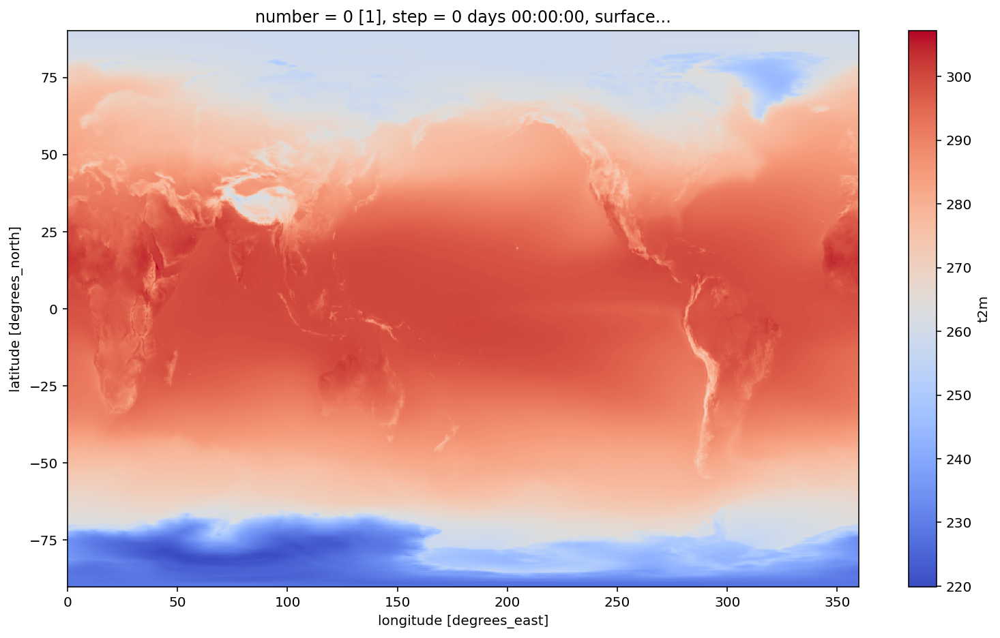

In [77]:
# t2m mean plto
plt.figure(1, figsize=[13,7.5])
t2m.mean("time").plot(cmap = 'coolwarm',
                           x="longitude")


I can select portion of dataset based on attributes in coordinates.

In [81]:
# Select May 1979
t2m.sel(time="1979-05")

<xarray.DataArray 't2m' (time: 124, latitude: 721, longitude: 1440)>
array([[[257.8049 , 257.8049 , ..., 257.8049 , 257.8049 ],
        [257.7131 , 257.7131 , ..., 257.71115, 257.71115],
        ...,
        [225.36154, 225.3674 , ..., 225.35568, 225.35959],
        [224.29318, 224.29318, ..., 224.29318, 224.29318]],

       [[259.1579 , 259.1579 , ..., 259.1579 , 259.1579 ],
        [258.6618 , 258.66376, ..., 258.65985, 258.6618 ],
        ...,
        [224.18913, 224.19304, ..., 224.18523, 224.18718],
        [223.16765, 223.16765, ..., 223.16765, 223.16765]],

       ...,

       [[268.06213, 268.06213, ..., 268.06213, 268.06213],
        [268.30627, 268.30627, ..., 268.30627, 268.30627],
        ...,
        [220.60901, 220.6051 , ..., 220.62659, 220.61682],
        [222.30823, 222.30823, ..., 222.30823, 222.30823]],

       [[268.34686, 268.34686, ..., 268.34686, 268.34686],
        [268.49725, 268.4953 , ..., 268.49725, 268.49725],
        ...,
        [218.89177, 218.89372, ..., 218.90154, 218.89763],
        [220.30779, 220.30779, ..., 220.30779, 220.30779]]], dtype=float32)
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1979-05-01 ... 1979-05-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
  * latitude    (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [82]:
# Slicing
# Select from May 1980 to July 1980 (both included)
t2m.sel(time=slice("1980-05", "1980-07"))
# (30+31+30)*4 = 368 time

<xarray.DataArray 't2m' (time: 368, latitude: 721, longitude: 1440)>
array([[[263.6167 , 263.6167 , ..., 263.6167 , 263.6167 ],
        [263.51318, 263.51123, ..., 263.5171 , 263.51514],
        ...,
        [222.04443, 222.04639, ..., 222.04443, 222.04443],
        [222.85889, 222.85889, ..., 222.85889, 222.85889]],

       [[263.88492, 263.88492, ..., 263.88492, 263.88492],
        [263.96695, 263.96695, ..., 263.96695, 263.96695],
        ...,
        [222.465  , 222.46695, ..., 222.46695, 222.465  ],
        [223.06265, 223.06265, ..., 223.06265, 223.06265]],

       ...,

       [[273.75665, 273.75665, ..., 273.75665, 273.75665],
        [273.82306, 273.82306, ..., 273.825  , 273.825  ],
        ...,
        [214.7469 , 214.75276, ..., 214.74104, 214.74495],
        [212.36995, 212.36995, ..., 212.36995, 212.36995]],

       [[273.79626, 273.79626, ..., 273.79626, 273.79626],
        [273.67322, 273.67322, ..., 273.67322, 273.67322],
        ...,
        [217.53456, 217.54042, ..., 217.52675, 217.53065],
        [214.7162 , 214.7162 , ..., 214.7162 , 214.7162 ]]], dtype=float32)
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1980-05-01 ... 1980-07-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
  * latitude    (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [84]:
# Select year 1981
t2m.sel(time="1981")

<xarray.DataArray 't2m' (time: 1460, latitude: 721, longitude: 1440)>
array([[[247.51617, 247.51617, ..., 247.51617, 247.51617],
        [248.21149, 248.21149, ..., 248.20758, 248.20953],
        ...,
        [246.19586, 246.19977, ..., 246.19977, 246.19781],
        [246.1529 , 246.1529 , ..., 246.1529 , 246.1529 ]],

       [[245.62917, 245.62917, ..., 245.62917, 245.62917],
        [246.35182, 246.35182, ..., 246.34792, 246.34987],
        ...,
        [245.70143, 245.70338, ..., 245.69948, 245.70143],
        [246.04909, 246.04909, ..., 246.04909, 246.04909]],

       ...,

       [[247.99654, 247.99654, ..., 247.99654, 247.99654],
        [248.71333, 248.71138, ..., 248.71333, 248.71333],
        ...,
        [247.64302, 247.64107, ..., 247.64302, 247.64302],
        [247.45161, 247.45161, ..., 247.45161, 247.45161]],

       [[250.31697, 250.31697, ..., 250.31697, 250.31697],
        [251.39705, 251.3951 , ..., 251.399  , 251.39705],
        ...,
        [247.54744, 247.54744, ..., 247.5494 , 247.5494 ],
        [247.07674, 247.07674, ..., 247.07674, 247.07674]]], dtype=float32)
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1981-01-01 ... 1981-12-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
  * latitude    (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [86]:
# Select data nearest to longitude 240.2
# Demonstrate "nearest" indexing
t2m.sel(longitude=240.2, method="nearest")
# longitude is a coordinate

<xarray.DataArray 't2m' (time: 4384, latitude: 721)>
array([[244.07765, 244.36867, 244.60109, ..., 248.55031, 248.98781, 249.28273],
       [245.08904, 244.98357, 245.05779, ..., 248.0949 , 248.54216, 248.81364],
       [248.10321, 248.23212, 248.5036 , ..., 247.73407, 248.11298, 248.48016],
       ...,
       [247.26993, 247.1879 , 247.32657, ..., 248.79532, 248.9047 , 248.80508],
       [247.99654, 248.07271, 248.2563 , ..., 247.00044, 247.3188 , 247.45161],
       [250.31697, 250.01228, 249.84236, ..., 246.7701 , 246.92049, 247.07674]],
      dtype=float32)
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
  * latitude    (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
    longitude   float64 240.2
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [88]:
# "nearest indexing at multiple points"
t2m.sel(longitude=[240.125, 234], latitude=[40.3, 50.3], method="nearest")

<xarray.DataArray 't2m' (time: 4384, latitude: 2, longitude: 2)>
array([[[272.32373, 282.28467],
        [244.10304, 260.70068]],

       [[265.65155, 282.41913],
        [240.90349, 259.61835]],

       ...,

       [[275.33246, 282.8188 ],
        [255.63911, 268.2641 ]],

       [[277.524  , 284.10992],
        [257.2232 , 268.46735]]], dtype=float32)
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
  * latitude    (latitude) float64 40.25 50.25
  * longitude   (longitude) float64 240.2 234.0
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [92]:
# pull out time index 0, lat index 2, and lon index 3
t2m.isel(time=0, latitude=2, longitude=3)  #  much better than t2m.air[0, 2, 3]

<xarray.DataArray 't2m' ()>
array(243.71828, dtype=float32)
Coordinates:
    number      int64 0
    time        datetime64[ns] 1979-01-01
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
    latitude    float64 89.5
    longitude   float64 0.75
    valid_time  datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

### Concepts for computation

Consider calculating the **mean air temperature per unit surface area** for this dataset. Because latitude and longitude correspond to spherical coordinates for Earth’s surface, each 2.5x2.5 degree grid cell actually has a different surface area as you move away from the equator! 

This is because *latitudinal length* is fixed $(\delta Lat = R\delta \phi)$, but *longitudinal length varies with latitude $(\delta Lon = R \delta \lambda cos(\phi))$*

So the area element for lat-lon coordinates is $\delta A = R² \delta \phi \lambda cos(\phi)$

where $\phi$ is the latitude,  $\delta \phi$ is the spacing of the points in latitude,  $\delta \lambda$ is the spacing of the points in longitude, and $R$ is the Earth’s radius. ( $\phi$ and  $\lambda$ are measured in radians).

In [31]:
# To understand better

In [94]:
# Earth's average radius in meters
R = 6.371e6

# Coordinate spacing for this dataset is 2.5 x 2.5 degrees
dϕ = np.deg2rad(2.5)
dλ = np.deg2rad(2.5)

dlat = R * dϕ * xr.ones_like(t2m.longitude)
dlon = R * dλ * np.cos(np.deg2rad(t2m.latitude))

In [96]:
# returns an xarray DataArray!
np.cos(np.deg2rad(t2m.latitude))

<xarray.DataArray 'latitude' (latitude: 721)>
array([6.12323400e-17, 4.36330928e-03, 8.72653550e-03, 1.30895956e-02,
       1.74524064e-02, 2.18148850e-02, 2.61769483e-02, 3.05385132e-02,
       3.48994967e-02, 3.92598158e-02, 4.36193874e-02, 4.79781285e-02,
       5.23359562e-02, 5.66927876e-02, 6.10485395e-02, 6.54031292e-02,
       6.97564737e-02, 7.41084902e-02, 7.84590957e-02, 8.28082075e-02,
       8.71557427e-02, 9.15016187e-02, 9.58457525e-02, 1.00188062e-01,
       1.04528463e-01, 1.08866875e-01, 1.13203214e-01, 1.17537397e-01,
       1.21869343e-01, 1.26198969e-01, 1.30526192e-01, 1.34850930e-01,
       1.39173101e-01, 1.43492622e-01, 1.47809411e-01, 1.52123386e-01,
       1.56434465e-01, 1.60742566e-01, 1.65047606e-01, 1.69349504e-01,
       1.73648178e-01, 1.77943545e-01, 1.82235525e-01, 1.86524036e-01,
       1.90808995e-01, 1.95090322e-01, 1.99367934e-01, 2.03641751e-01,
       2.07911691e-01, 2.12177672e-01, 2.16439614e-01, 2.20697435e-01,
       2.24951054e-01, 2.29200391e-01, 2.33445364e-01, 2.37685892e-01,
       2.41921896e-01, 2.46153293e-01, 2.50380004e-01, 2.54601948e-01,
       2.58819045e-01, 2.63031214e-01, 2.67238376e-01, 2.71440450e-01,
       2.75637356e-01, 2.79829014e-01, 2.84015345e-01, 2.88196268e-01,
       2.92371705e-01, 2.96541575e-01, 3.00705800e-01, 3.04864299e-01,
       3.09016994e-01, 3.13163806e-01, 3.17304656e-01, 3.21439465e-01,
       3.25568154e-01, 3.29690645e-01, 3.33806859e-01, 3.37916718e-01,
...
       3.25568154e-01, 3.21439465e-01, 3.17304656e-01, 3.13163806e-01,
       3.09016994e-01, 3.04864299e-01, 3.00705800e-01, 2.96541575e-01,
       2.92371705e-01, 2.88196268e-01, 2.84015345e-01, 2.79829014e-01,
       2.75637356e-01, 2.71440450e-01, 2.67238376e-01, 2.63031214e-01,
       2.58819045e-01, 2.54601948e-01, 2.50380004e-01, 2.46153293e-01,
       2.41921896e-01, 2.37685892e-01, 2.33445364e-01, 2.29200391e-01,
       2.24951054e-01, 2.20697435e-01, 2.16439614e-01, 2.12177672e-01,
       2.07911691e-01, 2.03641751e-01, 1.99367934e-01, 1.95090322e-01,
       1.90808995e-01, 1.86524036e-01, 1.82235525e-01, 1.77943545e-01,
       1.73648178e-01, 1.69349504e-01, 1.65047606e-01, 1.60742566e-01,
       1.56434465e-01, 1.52123386e-01, 1.47809411e-01, 1.43492622e-01,
       1.39173101e-01, 1.34850930e-01, 1.30526192e-01, 1.26198969e-01,
       1.21869343e-01, 1.17537397e-01, 1.13203214e-01, 1.08866875e-01,
       1.04528463e-01, 1.00188062e-01, 9.58457525e-02, 9.15016187e-02,
       8.71557427e-02, 8.28082075e-02, 7.84590957e-02, 7.41084902e-02,
       6.97564737e-02, 6.54031292e-02, 6.10485395e-02, 5.66927876e-02,
       5.23359562e-02, 4.79781285e-02, 4.36193874e-02, 3.92598158e-02,
       3.48994967e-02, 3.05385132e-02, 2.61769483e-02, 2.18148850e-02,
       1.74524064e-02, 1.30895956e-02, 8.72653550e-03, 4.36330928e-03,
       6.12323400e-17])
Coordinates:
    number    int64 0
    step      timedelta64[ns] 00:00:00
    surface   float64 0.0
  * latitude  (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
Attributes:
    units:             degrees_north
    standard_name:     latitude
    long_name:         latitude
    stored_direction:  decreasing

In [97]:
# Cell latitude length is constant with longitude
dlat

<xarray.DataArray 'longitude' (longitude: 1440)>
array([277987.3166114, 277987.3166114, 277987.3166114, ...,
       277987.3166114, 277987.3166114, 277987.3166114])
Coordinates:
    number     int64 0
    step       timedelta64[ns] 00:00:00
    surface    float64 0.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Attributes:
    units:          degrees_east
    standard_name:  longitude
    long_name:      longitude

In [98]:
# Cell longitude length changes with latitude
dlon

<xarray.DataArray 'latitude' (latitude: 721)>
array([1.70218139e-11, 1.21294464e+03, 2.42586619e+03, 3.63874155e+03,
       4.85154763e+03, 6.06426135e+03, 7.27685962e+03, 8.48931934e+03,
       9.70161744e+03, 1.09137308e+04, 1.21256364e+04, 1.33373112e+04,
       1.45487320e+04, 1.57598759e+04, 1.69707197e+04, 1.81812404e+04,
       1.93914150e+04, 2.06012203e+04, 2.18106335e+04, 2.30196314e+04,
       2.42281911e+04, 2.54362894e+04, 2.66439036e+04, 2.78510104e+04,
       2.90575870e+04, 3.02636104e+04, 3.14690576e+04, 3.26739057e+04,
       3.38781318e+04, 3.50817128e+04, 3.62846259e+04, 3.74868482e+04,
       3.86883569e+04, 3.98891289e+04, 4.10891416e+04, 4.22883719e+04,
       4.34867972e+04, 4.46843945e+04, 4.58811411e+04, 4.70770141e+04,
       4.82719909e+04, 4.94660487e+04, 5.06591647e+04, 5.18513163e+04,
       5.30424806e+04, 5.42326351e+04, 5.54217571e+04, 5.66098239e+04,
       5.77968130e+04, 5.89827017e+04, 6.01674675e+04, 6.13510877e+04,
       6.25335400e+04, 6.37148016e+04, 6.48948503e+04, 6.60736634e+04,
       6.72512186e+04, 6.84274934e+04, 6.96024655e+04, 7.07761124e+04,
       7.19484118e+04, 7.31193415e+04, 7.42888791e+04, 7.54570023e+04,
       7.66236889e+04, 7.77889167e+04, 7.89526636e+04, 8.01149072e+04,
       8.12756256e+04, 8.24347967e+04, 8.35923983e+04, 8.47484084e+04,
       8.59028051e+04, 8.70555662e+04, 8.82066700e+04, 8.93560944e+04,
       9.05038176e+04, 9.16498178e+04, 9.27940731e+04, 9.39365617e+04,
...
       9.05038176e+04, 8.93560944e+04, 8.82066700e+04, 8.70555662e+04,
       8.59028051e+04, 8.47484084e+04, 8.35923983e+04, 8.24347967e+04,
       8.12756256e+04, 8.01149072e+04, 7.89526636e+04, 7.77889167e+04,
       7.66236889e+04, 7.54570023e+04, 7.42888791e+04, 7.31193415e+04,
       7.19484118e+04, 7.07761124e+04, 6.96024655e+04, 6.84274934e+04,
       6.72512186e+04, 6.60736634e+04, 6.48948503e+04, 6.37148016e+04,
       6.25335400e+04, 6.13510877e+04, 6.01674675e+04, 5.89827017e+04,
       5.77968130e+04, 5.66098239e+04, 5.54217571e+04, 5.42326351e+04,
       5.30424806e+04, 5.18513163e+04, 5.06591647e+04, 4.94660487e+04,
       4.82719909e+04, 4.70770141e+04, 4.58811411e+04, 4.46843945e+04,
       4.34867972e+04, 4.22883719e+04, 4.10891416e+04, 3.98891289e+04,
       3.86883569e+04, 3.74868482e+04, 3.62846259e+04, 3.50817128e+04,
       3.38781318e+04, 3.26739057e+04, 3.14690576e+04, 3.02636104e+04,
       2.90575870e+04, 2.78510104e+04, 2.66439036e+04, 2.54362894e+04,
       2.42281911e+04, 2.30196314e+04, 2.18106335e+04, 2.06012203e+04,
       1.93914150e+04, 1.81812404e+04, 1.69707197e+04, 1.57598759e+04,
       1.45487320e+04, 1.33373112e+04, 1.21256364e+04, 1.09137308e+04,
       9.70161744e+03, 8.48931934e+03, 7.27685962e+03, 6.06426135e+03,
       4.85154763e+03, 3.63874155e+03, 2.42586619e+03, 1.21294464e+03,
       1.70218139e-11])
Coordinates:
    number    int64 0
    step      timedelta64[ns] 00:00:00
    surface   float64 0.0
  * latitude  (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
Attributes:
    units:             degrees_north
    standard_name:     latitude
    long_name:         latitude
    stored_direction:  decreasing

Our longitude and latitude length DataArrays are both 1D with different dimension names. If we multiple these DataArrays together the dimensionality is expanded to 2D by broadcasting:

In [99]:
cell_area = dlon * dlat
cell_area

<xarray.DataArray (latitude: 721, longitude: 1440)>
array([[4.73184836e-06, 4.73184836e-06, 4.73184836e-06, ...,
        4.73184836e-06, 4.73184836e-06, 4.73184836e-06],
       [3.37183226e+08, 3.37183226e+08, 3.37183226e+08, ...,
        3.37183226e+08, 3.37183226e+08, 3.37183226e+08],
       [6.74360032e+08, 6.74360032e+08, 6.74360032e+08, ...,
        6.74360032e+08, 6.74360032e+08, 6.74360032e+08],
       ...,
       [6.74360032e+08, 6.74360032e+08, 6.74360032e+08, ...,
        6.74360032e+08, 6.74360032e+08, 6.74360032e+08],
       [3.37183226e+08, 3.37183226e+08, 3.37183226e+08, ...,
        3.37183226e+08, 3.37183226e+08, 3.37183226e+08],
       [4.73184836e-06, 4.73184836e-06, 4.73184836e-06, ...,
        4.73184836e-06, 4.73184836e-06, 4.73184836e-06]])
Coordinates:
    number     int64 0
    step       timedelta64[ns] 00:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8

In [45]:
# Group data by season
t2m.groupby("time.season")

DataArrayGroupBy, grouped over 'season'
4 groups with labels 'DJF', 'JJA', 'MAM', 'SON'.

Labels: Each group is given a label, and the four labels are 'DJF', 'JJA', 'MAM', and 'SON'. These labels likely correspond to the seasons: DJF stands for December-January-February, JJA stands for June-July-August, MAM stands for March-April-May, and SON stands for September-October-November

In [100]:
# Seasonal mean
seasonal_mean = t2m.groupby("time.season").mean()
seasonal_mean

<xarray.DataArray 't2m' (season: 4, latitude: 721, longitude: 1440)>
array([[[247.22105, 247.22105, 247.22105, ..., 247.22105, 247.22105,
         247.22105],
        [247.49922, 247.49812, 247.49698, ..., 247.50208, 247.50116,
         247.50029],
        [247.72876, 247.72644, 247.72409, ..., 247.73415, 247.7323 ,
         247.73058],
        ...,
        [241.47156, 241.47188, 241.47235, ..., 241.47075, 241.4712 ,
         241.47148],
        [241.27356, 241.27394, 241.27419, ..., 241.27277, 241.27304,
         241.27339],
        [240.97743, 240.97743, 240.97743, ..., 240.97743, 240.97743,
         240.97743]],

       [[273.23566, 273.23566, 273.23566, ..., 273.23566, 273.23566,
         273.23566],
        [273.20966, 273.20972, 273.20975, ..., 273.21   , 273.20984,
         273.20966],
        [273.20477, 273.20502, 273.2052 , ..., 273.20517, 273.20508,
         273.205  ],
...
        [224.67627, 224.67865, 224.68188, ..., 224.67099, 224.67363,
         224.67537],
        [224.51976, 224.5217 , 224.52388, ..., 224.516  , 224.51729,
         224.51865],
        [223.9538 , 223.9538 , 223.9538 , ..., 223.9538 , 223.9538 ,
         223.9538 ]],

       [[258.27756, 258.27756, 258.27756, ..., 258.27756, 258.27756,
         258.27756],
        [258.5468 , 258.54678, 258.54678, ..., 258.54553, 258.54596,
         258.54636],
        [258.8081 , 258.80832, 258.80838, ..., 258.80594, 258.80655,
         258.8074 ],
        ...,
        [227.6529 , 227.65419, 227.6558 , ..., 227.64977, 227.6515 ,
         227.6526 ],
        [227.56445, 227.56601, 227.56714, ..., 227.56201, 227.56287,
         227.56377],
        [227.11168, 227.11168, 227.11168, ..., 227.11168, 227.11168,
         227.11168]]], dtype=float32)
Coordinates:
    number     int64 0
    step       timedelta64[ns] 00:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [112]:
# Seasonal mean of season DJF
seasonal_mean.sel(season="DJF")

<xarray.DataArray 't2m' (latitude: 721, longitude: 1440)>
array([[247.22105, 247.22105, 247.22105, ..., 247.22105, 247.22105,
        247.22105],
       [247.49922, 247.49812, 247.49698, ..., 247.50208, 247.50116,
        247.50029],
       [247.72876, 247.72644, 247.72409, ..., 247.73415, 247.7323 ,
        247.73058],
       ...,
       [241.47156, 241.47188, 241.47235, ..., 241.47075, 241.4712 ,
        241.47148],
       [241.27356, 241.27394, 241.27419, ..., 241.27277, 241.27304,
        241.27339],
       [240.97743, 240.97743, 240.97743, ..., 240.97743, 240.97743,
        240.97743]], dtype=float32)
Coordinates:
    number     int64 0
    step       timedelta64[ns] 00:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    season     <U3 'DJF'
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

In [113]:
# Seasonal mean of first season (season=0)
seasonal_mean.isel(season=0)

<xarray.DataArray 't2m' (latitude: 721, longitude: 1440)>
array([[247.22105, 247.22105, 247.22105, ..., 247.22105, 247.22105,
        247.22105],
       [247.49922, 247.49812, 247.49698, ..., 247.50208, 247.50116,
        247.50029],
       [247.72876, 247.72644, 247.72409, ..., 247.73415, 247.7323 ,
        247.73058],
       ...,
       [241.47156, 241.47188, 241.47235, ..., 241.47075, 241.4712 ,
        241.47148],
       [241.27356, 241.27394, 241.27419, ..., 241.27277, 241.27304,
        241.27339],
       [240.97743, 240.97743, 240.97743, ..., 240.97743, 240.97743,
        240.97743]], dtype=float32)
Coordinates:
    number     int64 0
    step       timedelta64[ns] 00:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    season     <U3 'DJF'
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

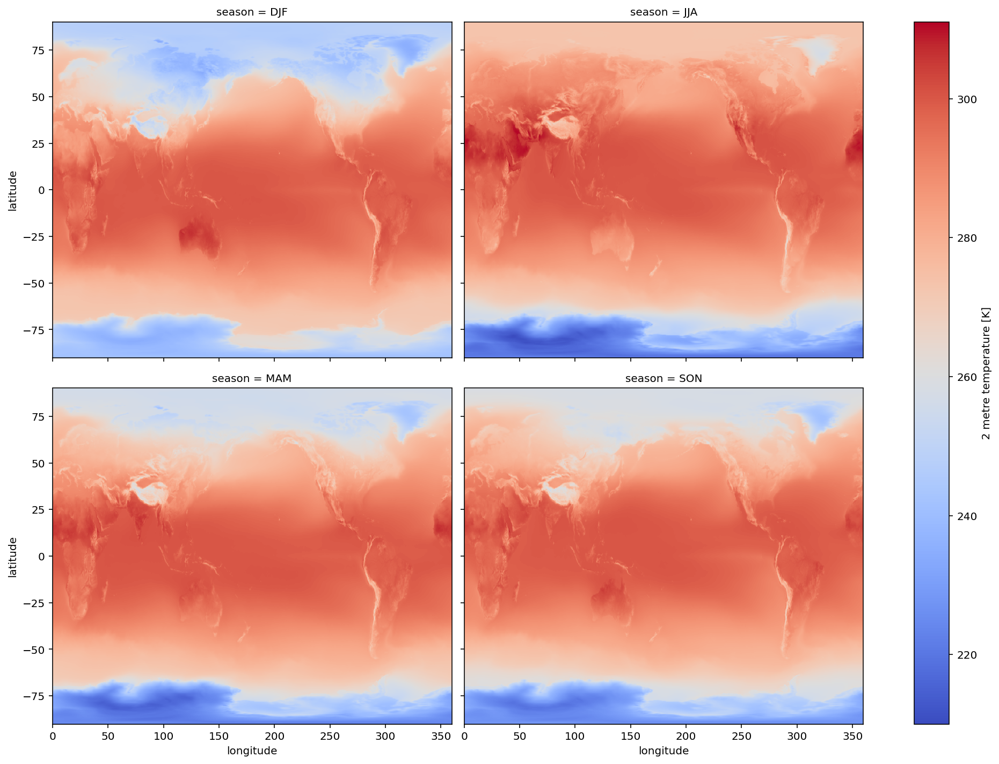

In [144]:
# Seasonal mean plot
seasonal_mean.plot(col="season",
                   cmap = 'coolwarm',
                   aspect=1.3,
                   size=5, col_wrap=2)

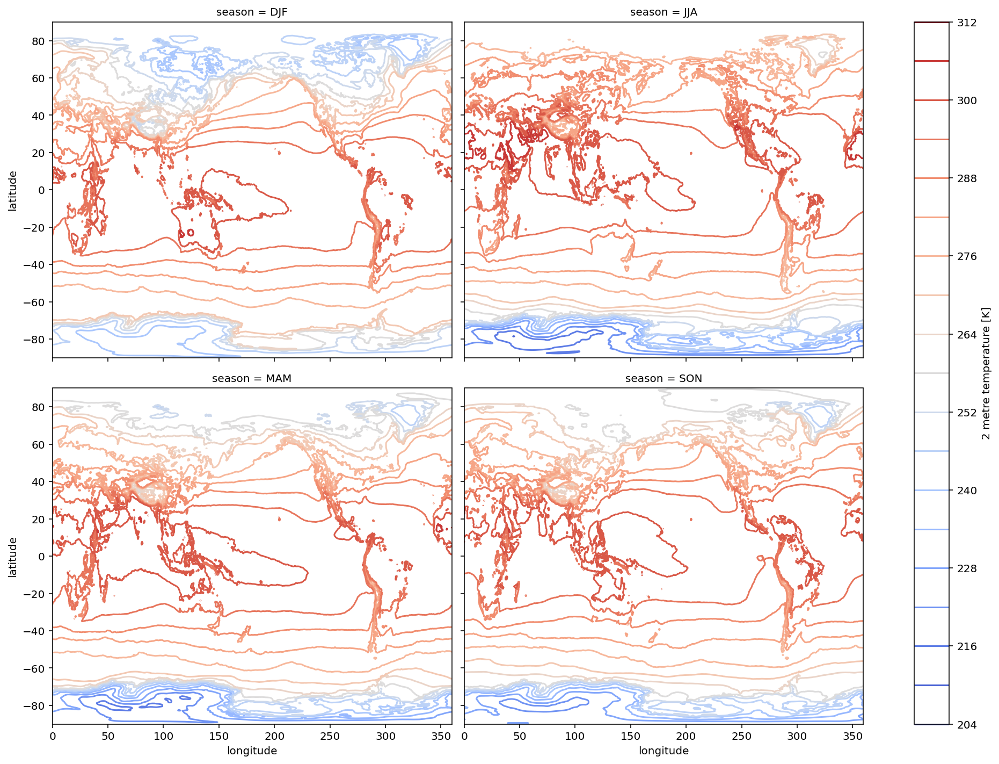

In [147]:
# Seasonal mean plot contour
seasonal_mean.plot.contour(col="season", cmap = 'coolwarm',
                           levels=20, add_colorbar=True,
                           aspect=1.3, size=5, col_wrap=2)

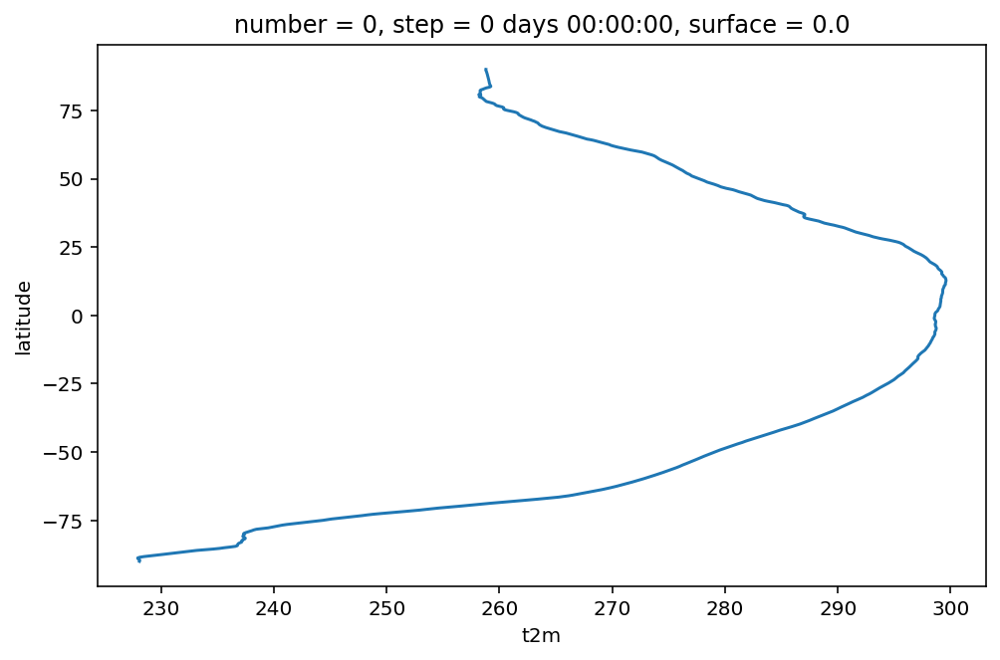

In [150]:
# To understand better
plt.figure(1, figsize=[8,5])
# weight by cell_area and take mean over (time, lon)
t2m.weighted(cell_area).mean(["longitude", "time"]).plot(y="latitude")

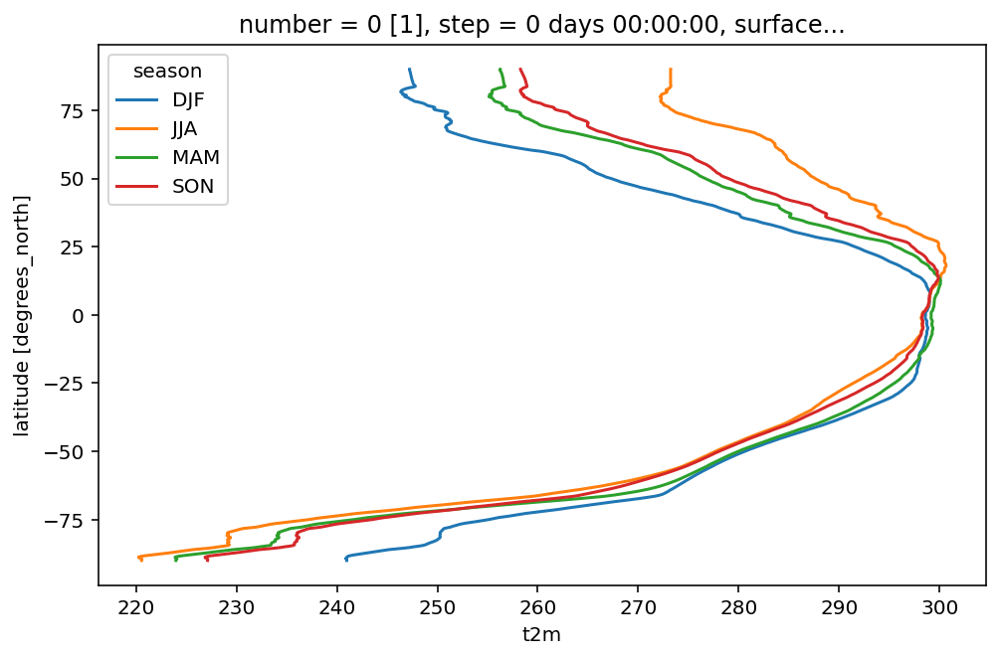

In [151]:
# Seasonal mean by longitude
plt.figure(1, figsize=[8,5])
seasonal_mean.mean("longitude").plot.line(hue="season", y="latitude")

In [140]:
# Resample to monthly frequency
t2m.resample(time="M").mean()

<xarray.DataArray 't2m' (time: 36, latitude: 721, longitude: 1440)>
array([[[244.70993, 244.70993, 244.70993, ..., 244.70993, 244.70993,
         244.70993],
        [245.12088, 245.11948, 245.11804, ..., 245.12256, 245.12187,
         245.1214 ],
        [245.37856, 245.37486, 245.37144, ..., 245.38301, 245.38219,
         245.38065],
        ...,
        [243.54692, 243.54729, 243.54782, ..., 243.54573, 243.54639,
         243.54675],
        [243.33221, 243.33272, 243.33298, ..., 243.33144, 243.33176,
         243.33205],
        [242.98303, 242.98303, 242.98303, ..., 242.98303, 242.98303,
         242.98303]],

       [[241.45445, 241.45445, 241.45445, ..., 241.45445, 241.45445,
         241.45445],
        [241.66885, 241.66731, 241.66542, ..., 241.6733 , 241.67183,
         241.67032],
        [241.70067, 241.69685, 241.69316, ..., 241.71045, 241.70757,
         241.70442],
...
        [235.15985, 235.16017, 235.1609 , ..., 235.15822, 235.1592 ,
         235.15984],
        [235.03815, 235.03883, 235.03963, ..., 235.03648, 235.0372 ,
         235.0377 ],
        [234.67259, 234.67259, 234.67259, ..., 234.67259, 234.67259,
         234.67259]],

       [[249.20062, 249.20062, 249.20062, ..., 249.20062, 249.20062,
         249.20062],
        [250.01308, 250.01189, 250.01079, ..., 250.01604, 250.01495,
         250.01408],
        [250.63713, 250.63503, 250.63272, ..., 250.6413 , 250.6396 ,
         250.6382 ],
        ...,
        [244.50656, 244.50694, 244.50711, ..., 244.50536, 244.50583,
         244.5062 ],
        [244.38911, 244.3893 , 244.38927, ..., 244.38841, 244.38867,
         244.38895],
        [244.15018, 244.15018, 244.15018, ..., 244.15018, 244.15018,
         244.15018]]], dtype=float32)
Coordinates:
    number     int64 0
    step       timedelta64[ns] 00:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * time       (time) datetime64[ns] 1979-01-31 1979-02-28 ... 1981-12-31
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

"M" stands for "Month-End". It is a frequency alias used to resample time series data at the end of each calendar month

In [155]:
# DataArray with time values
t2m.time.values

array(['1979-01-01T00:00:00.000000000', '1979-01-01T06:00:00.000000000',
       '1979-01-01T12:00:00.000000000', ...,
       '1981-12-31T06:00:00.000000000', '1981-12-31T12:00:00.000000000',
       '1981-12-31T18:00:00.000000000'], dtype='datetime64[ns]')

In [161]:
t2m_1d = t2m.isel(latitude=10, longitude=10)
t2m_1d = t2m_1d.sel(time="1980")
t2m_1d

<xarray.DataArray 't2m' (time: 1464)>
array([252.27496, 250.48817, 251.49066, ..., 250.14139, 249.39899, 248.91713],
      dtype=float32)
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1980-01-01 ... 1980-12-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
    latitude    float64 87.5
    longitude   float64 2.5
    valid_time  (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown

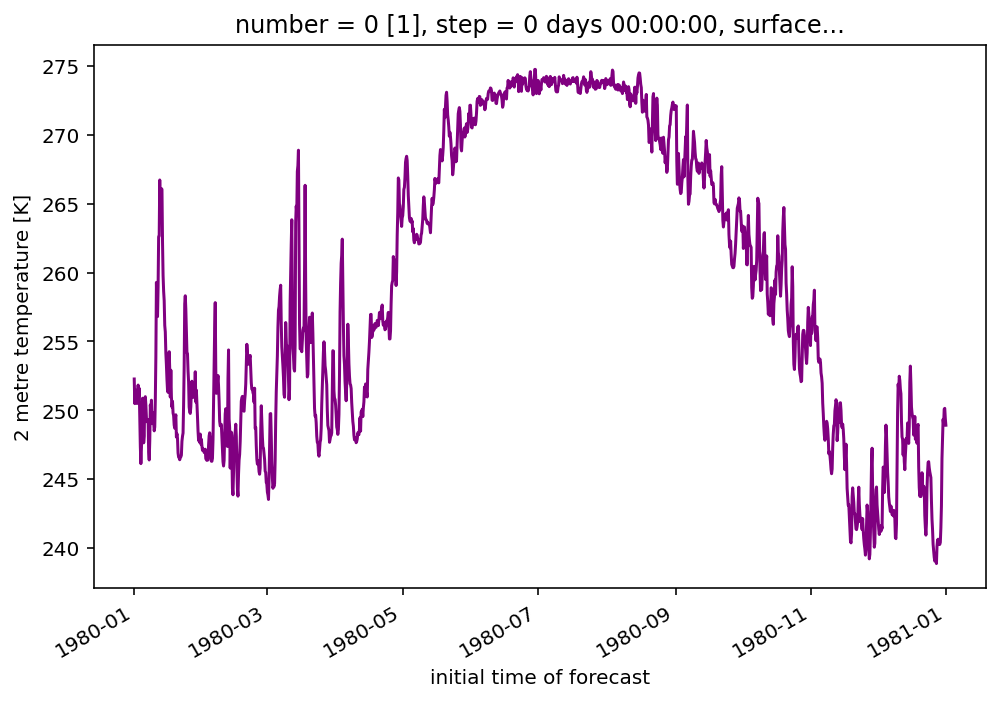

In [164]:
plt.figure(1, figsize=[8,5])
t2m_1d.plot.line(color="purple")

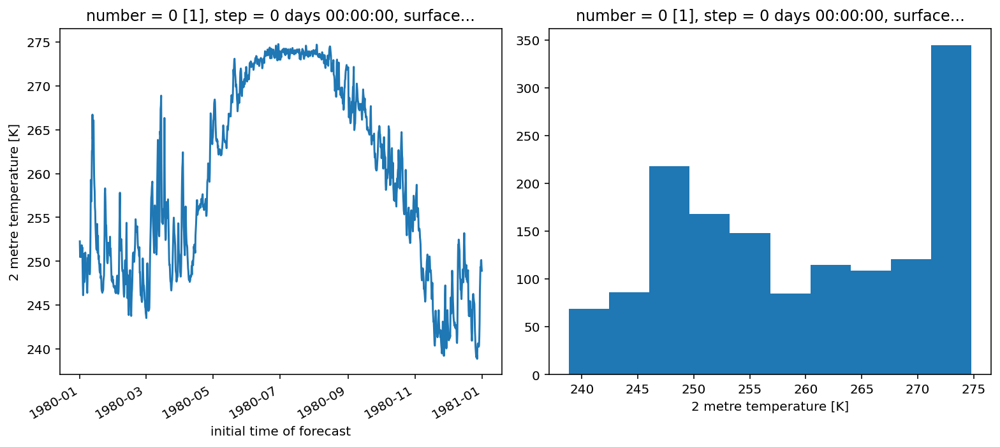

In [179]:
fig, axs = plt.subplots(ncols=2, figsize=[11,5])
t2m_1d.plot(ax=axs[0])
t2m_1d.plot.hist(ax=axs[1])
plt.tight_layout()
plt.draw()

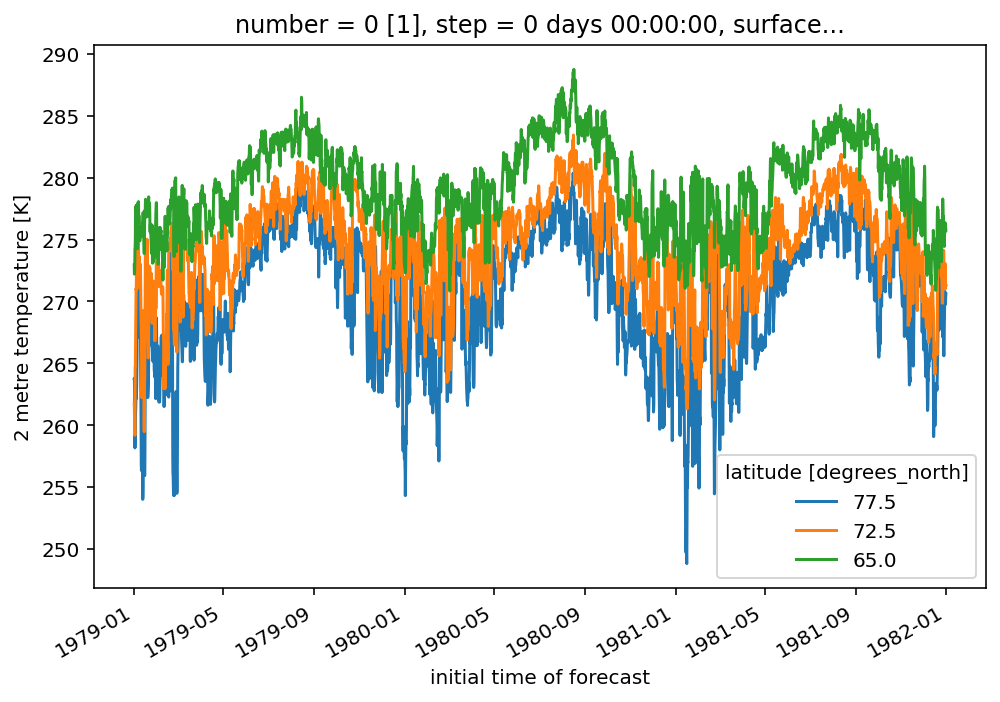

In [188]:
plt.figure(1, figsize=[8,5])
t2m.isel(longitude=10, latitude=[50, 70, 100]).plot.line(x="time")

**Missing Values**

In [192]:
t2m.time.isnull()

<xarray.DataArray 'time' (time: 4384)>
array([False, False, False, ..., False, False, False])
Coordinates:
    number      int64 0
  * time        (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step        timedelta64[ns] 00:00:00
    surface     float64 0.0
    valid_time  (time) datetime64[ns] ...

In [191]:
t2m.time.count()
# No missing values

<xarray.DataArray 'time' ()>
array(4384)
Coordinates:
    number   int64 0
    step     timedelta64[ns] 00:00:00
    surface  float64 0.0

# Reorganization dataset

In [230]:
dsrt = xr.open_dataset(config['path_pressure_level_rt'], engine='cfgrib')
dsuv = xr.open_dataset(config['path_pressure_level_uv'], engine='cfgrib')
dszq = xr.open_dataset(config['path_pressure_level_zq'], engine='cfgrib')
dssl = xr.open_dataset(config['path_single_level_data'], engine='cfgrib')

In [ ]:
dsrt

In [231]:
dsrt.data_vars

Data variables:
    q        (time, isobaricInhPa, latitude, longitude) float32 ...
    t        (time, isobaricInhPa, latitude, longitude) float32 ...

In [4]:
dsrt.sel(isobaricInhPa=925.0)

<xarray.Dataset>
Dimensions:        (time: 4384, latitude: 721, longitude: 1440)
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
    isobaricInhPa  float64 925.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
Data variables:
    q              (time, latitude, longitude) float32 ...
    t              (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2023-07-30T10:41 GRIB to CDM+CF via cfgrib-0.9.1...

In [238]:
dsrt.q

<xarray.DataArray 'q' (time: 4384, isobaricInhPa: 7, latitude: 721,
                       longitude: 1440)>
[31861509120 values with dtype=float32]
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
  * isobaricInhPa  (isobaricInhPa) float64 925.0 850.0 700.0 ... 250.0 50.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             133
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         isobaricInhPa
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           q
    GRIB_totalNumber:                         0
    GRIB_units:                               kg kg**-1
    long_name:                                Specific humidity
    units:                                    kg kg**-1
    standard_name:                            specific_humidity

In [5]:
# To put into utils.py models branch 
def dataArray2list(dataArray: xr.DataArray):

    listds = []
    for var_name, _ in dataArray.data_vars.items(): # loop on var
        
        ds = dataArray[var_name]
        listds_small = []
        
        for pl in ds.coords["isobaricInhPa"].values.tolist(): # loop on pressure levels
        
            ds_small = ds.sel(isobaricInhPa=pl)  # sele
            listds_small.append(ds_small)
        
        listds.append(listds_small)
      
    return [item for sublist in listds for item in sublist] # combined list

# do list of lists: list_rt, list_uv, list_zq

def add_plvar_to_slvar(list_tot:list,
                       dssl: xr.DataArray) -> xr.DataArray:

    for ds in list_tot:
        name = ds.name
        pl = int(ds.coords['isobaricInhPa'].values)
        new_name = name + str(pl)
        dssl[new_name] = ds
    
    return dssl

In [8]:
ds_sl = xr.open_dataset(config["path_single_level_data"], engine='cfgrib')
ds_rt = xr.open_dataset(config["path_pressure_level_rt"], engine='cfgrib')
ds_uv = xr.open_dataset(config["path_pressure_level_uv"], engine='cfgrib')
ds_zq = xr.open_dataset(config["path_pressure_level_zq"], engine='cfgrib')
        
list_rt = dataArray2list(dataArray=ds_rt)
list_uv = dataArray2list(dataArray=ds_uv)
list_zq = dataArray2list(dataArray=ds_zq)
        
list_tot = list_rt + list_uv + list_zq
        
ds = add_plvar_to_slvar(list_tot = list_tot, dssl = ds_sl)

In [9]:
list_tot[0]

<xarray.DataArray 'q' (time: 4384, latitude: 721, longitude: 1440)>
[4551644160 values with dtype=float32]
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
    isobaricInhPa  float64 925.0
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
Attributes: (12/30)
    GRIB_paramId:                             133
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         isobaricInhPa
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_shortName:                           q
    GRIB_totalNumber:                         0
    GRIB_units:                               kg kg**-1
    long_name:                                Specific humidity
    units:                                    kg kg**-1
    standard_name:                            specific_humidity

In [11]:
#ok
for ds in list_tot:
    name = ds.name
    pl = int(ds.coords['isobaricInhPa'].values)
    new_name = name + str(pl)
    dssl[new_name] = ds

In [12]:
dssl

<xarray.Dataset>
Dimensions:        (time: 4384, latitude: 721, longitude: 1440)
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
    surface        float64 ...
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
    isobaricInhPa  float64 925.0
Data variables: (12/49)
    u10            (time, latitude, longitude) float32 ...
    v10            (time, latitude, longitude) float32 ...
    t2m            (time, latitude, longitude) float32 ...
    z              (time, latitude, longitude) float32 ...
    lsm            (time, latitude, longitude) float32 ...
    msl            (time, latitude, longitude) float32 ...
    ...             ...
    r850           (time, latitude, longitude) float32 ...
    r700           (time, latitude, longitude) float32 ...
    r600           (time, latitude, longitude) float32 ...
    r500           (time, latitude, longitude) float32 ...
    r250           (time, latitude, longitude) float32 ...
    r50            (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2023-07-30T10:41 GRIB to CDM+CF via cfgrib-0.9.1...

In [271]:
x

<xarray.Dataset>
Dimensions:        (time: 4384, latitude: 721, longitude: 1440)
Coordinates:
    number         int64 ...
  * time           (time) datetime64[ns] 1979-01-01 ... 1981-12-31T18:00:00
    step           timedelta64[ns] ...
    surface        float64 ...
  * latitude       (latitude) float64 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    valid_time     (time) datetime64[ns] ...
    isobaricInhPa  float64 925.0
Data variables: (12/14)
    u10            (time, latitude, longitude) float32 ...
    v10            (time, latitude, longitude) float32 ...
    t2m            (time, latitude, longitude) float32 ...
    z              (time, latitude, longitude) float32 ...
    lsm            (time, latitude, longitude) float32 ...
    msl            (time, latitude, longitude) float32 ...
    ...             ...
    q850           (time, latitude, longitude) float32 ...
    q700           (time, latitude, longitude) float32 ...
    q600           (time, latitude, longitude) float32 ...
    q500           (time, latitude, longitude) float32 ...
    q250           (time, latitude, longitude) float32 ...
    q50            (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2023-07-26T16:41 GRIB to CDM+CF via cfgrib-0.9.1...

In [258]:
dssl.data_vars

Data variables:
    u10      (time, latitude, longitude) float32 ...
    v10      (time, latitude, longitude) float32 ...
    t2m      (time, latitude, longitude) float32 ...
    z        (time, latitude, longitude) float32 ...
    lsm      (time, latitude, longitude) float32 ...
    msl      (time, latitude, longitude) float32 ...
    slt      (time, latitude, longitude) float32 ...

# Regridding